In [1]:
import cv2 as cv
import matplotlib.pyplot as plt
import os
import pandas as pd
import numpy as np
import seaborn as sns
import glob
from tqdm.notebook import tqdm
from itertools import combinations
from collections import defaultdict
import h5py
import networkx as nx
from concurrent.futures import ThreadPoolExecutor

In [67]:
from data_preprocess.image_matching_dataset import ImageMatchingDataset
import torchvision.transforms as transforms
import torch

from feature_descriptors.sift_descriptor import get_keypoint_and_descriptor
from feature_matching.flann_matcher import flann_matcher
from load_h5py_files import load_sift_output, load_flann_output, load_flann_from_images_name
from clustering.cluster_images import build_graph, graph_clustering

In [3]:
# Transform the dataset image as tensor
train_dataset = ImageMatchingDataset(labels_path='data/train_labels.csv', root_dir='data/train',
                                    transform=transforms.Compose([transforms.PILToTensor()])
                                    )

In [4]:
grouped_data = defaultdict(list)

for i in range(len(train_dataset)):
    sample = train_dataset[i]
    dataset_name = sample["dataset_name"]
    grouped_data[dataset_name].append(sample)

grouped_data

defaultdict(list,
            {'imc2023_haiper': [{'image': tensor([[[177, 177, 177,  ...,  73,  73,  73],
                        [175, 174, 174,  ...,  77,  77,  77],
                        [174, 173, 172,  ...,  76,  75,  75],
                        ...,
                        [ 86,  89,  91,  ..., 133, 129, 118],
                        [ 83,  86,  90,  ..., 136, 126, 101],
                        [ 81,  85,  90,  ..., 141, 120,  83]],
               
                       [[181, 181, 181,  ..., 109, 109, 109],
                        [179, 178, 178,  ..., 113, 113, 113],
                        [176, 175, 174,  ..., 112, 111, 111],
                        ...,
                        [121, 124, 126,  ..., 131, 127, 116],
                        [118, 121, 125,  ..., 134, 124,  99],
                        [116, 120, 125,  ..., 139, 118,  81]],
               
                       [[180, 180, 180,  ...,  37,  37,  37],
                        [178, 177, 177,  ...,  41,  41,  

In [5]:
grouped_data.keys()

dict_keys(['imc2023_haiper', 'imc2023_heritage', 'imc2023_theather_imc2024_church', 'imc2024_dioscuri_baalshamin', 'imc2024_lizard_pond', 'pt_brandenburg_british_buckingham', 'pt_piazzasanmarco_grandplace', 'pt_sacrecoeur_trevi_tajmahal', 'pt_stpeters_stpauls', 'amy_gardens', 'fbk_vineyard', 'ETs', 'stairs'])

# Image matching

In [5]:
sift_nfeatures = 15000
sift_outputs_dir = "sift_descriptor_outputs"
flann_outputs_dir = "flann_outputs"

In [6]:
def run_and_save_sift(dataset_name, filename, sift_nfeatures):
    with h5py.File(filename, "w") as f:
        for i in range(len(grouped_data[dataset_name])):
            sample = grouped_data[dataset_name][i]
            print(f"iteration {i}: calculate descriptors for {sample['image_name']}")
            img_np, kps, des = get_keypoint_and_descriptor(sample["image"], sift_nfeatures=sift_nfeatures)
            kps_arr = np.array([
                (kp.pt[0], kp.pt[1], kp.size, kp.angle, kp.response, kp.octave, kp.class_id)
                for kp in kps
            ], dtype=np.float32)

            group = f.create_group(sample["image_name"])
            group.create_dataset("image_np", data=img_np)
            group.create_dataset("keypoints", data=kps_arr)
            if des is not None:
                group.create_dataset("descriptors", data=des)

def get_pairs(num_image):
    return list(combinations(range(num_image), 2))

def get_images_name(dataset_name):
    images_name = [sample["image_name"] for sample in grouped_data[dataset_name]]
    return images_name

def run_flann(descriptor_filename, images_name, pairs, num_workers=8):
    results = []
    with ThreadPoolExecutor(max_workers=num_workers) as pool:
        for match, i, j in pool.map(lambda p: flann_matcher(*p, descriptor_filename, images_name), pairs):
            results.append({"pair": (i,j),
                           "image1_name" : images_name[i],
                           "image2_name" : images_name[j],
                           "good_matches": match
                            })
    
    return results

def save_flann_output(results, filename):
    with h5py.File(filename, "w") as f:
        for r in results:
            pair = r["pair"]
            matches_arr = np.array([
                (m.queryIdx, m.trainIdx, m.imgIdx, m.distance) for m in r["good_matches"]
            ])
            images_name = [r["image1_name"], r["image2_name"]]

            group = f.create_group(str(pair))
            group.create_dataset("pair", data=pair)
            dt = h5py.string_dtype(encoding='utf-8')
            group.create_dataset("images_name", data=np.array(images_name, dtype=object), dtype=dt)
            group.create_dataset("good_matches", data=matches_arr)

## Dataset: ETs

In [7]:
ets_descriptor_filename = "ETs_descriptor.h5"
run_and_save_sift("ETs", f"{sift_outputs_dir}/{ets_descriptor_filename}", sift_nfeatures)

iteration 0: calculate descriptors for outliers_out_et001.png
iteration 1: calculate descriptors for outliers_out_et003.png
iteration 2: calculate descriptors for outliers_out_et002.png
iteration 3: calculate descriptors for et_et007.png
iteration 4: calculate descriptors for et_et003.png
iteration 5: calculate descriptors for et_et006.png
iteration 6: calculate descriptors for et_et001.png
iteration 7: calculate descriptors for et_et004.png
iteration 8: calculate descriptors for et_et002.png
iteration 9: calculate descriptors for et_et008.png
iteration 10: calculate descriptors for et_et005.png
iteration 11: calculate descriptors for et_et000.png
iteration 12: calculate descriptors for another_et_another_et006.png
iteration 13: calculate descriptors for another_et_another_et002.png
iteration 14: calculate descriptors for another_et_another_et010.png
iteration 15: calculate descriptors for another_et_another_et004.png
iteration 16: calculate descriptors for another_et_another_et007.png

In [7]:
ets_pairs = get_pairs(len(grouped_data["ETs"]))
ets_images_name = get_images_name("ETs")

print(f"num. of pairs: {len(ets_pairs)}")
print(f"list of images name: {ets_images_name}")

num. of pairs: 231
list of images name: ['outliers_out_et001.png', 'outliers_out_et003.png', 'outliers_out_et002.png', 'et_et007.png', 'et_et003.png', 'et_et006.png', 'et_et001.png', 'et_et004.png', 'et_et002.png', 'et_et008.png', 'et_et005.png', 'et_et000.png', 'another_et_another_et006.png', 'another_et_another_et002.png', 'another_et_another_et010.png', 'another_et_another_et004.png', 'another_et_another_et007.png', 'another_et_another_et008.png', 'another_et_another_et003.png', 'another_et_another_et005.png', 'another_et_another_et001.png', 'another_et_another_et009.png']


In [9]:
ets_results = run_flann(f"{sift_outputs_dir}/{ets_descriptor_filename}", ets_images_name, ets_pairs)
save_flann_output(ets_results, f"{flann_outputs_dir}/ETs_flann.h5")

## Dataset: stairs

In [45]:
stairs_descriptor_filename = "stairs_descriptor.h5"
run_and_save_sift("stairs", f"{sift_outputs_dir}/{stairs_descriptor_filename}", sift_nfeatures)

iteration 0: calculate descriptors for stairs_split_1_1710453963274.png
iteration 1: calculate descriptors for stairs_split_1_1710453947066.png
iteration 2: calculate descriptors for stairs_split_1_1710453985484.png
iteration 3: calculate descriptors for stairs_split_1_1710453930259.png
iteration 4: calculate descriptors for stairs_split_1_1710453901046.png
iteration 5: calculate descriptors for stairs_split_1_1710453693529.png
iteration 6: calculate descriptors for stairs_split_1_1710453689727.png
iteration 7: calculate descriptors for stairs_split_1_1710453704934.png
iteration 8: calculate descriptors for stairs_split_1_1710453675921.png
iteration 9: calculate descriptors for stairs_split_1_1710453606287.png
iteration 10: calculate descriptors for stairs_split_1_1710453990286.png
iteration 11: calculate descriptors for stairs_split_1_1710453663515.png
iteration 12: calculate descriptors for stairs_split_1_1710453912451.png
iteration 13: calculate descriptors for stairs_split_1_171045

In [8]:
stairs_pairs = get_pairs(len(grouped_data["stairs"]))
stairs_images_name = get_images_name("stairs")

print(f"num. of pairs: {len(stairs_pairs)}")
print(f"list of images name: {stairs_images_name}")

num. of pairs: 1275
list of images name: ['stairs_split_1_1710453963274.png', 'stairs_split_1_1710453947066.png', 'stairs_split_1_1710453985484.png', 'stairs_split_1_1710453930259.png', 'stairs_split_1_1710453901046.png', 'stairs_split_1_1710453693529.png', 'stairs_split_1_1710453689727.png', 'stairs_split_1_1710453704934.png', 'stairs_split_1_1710453675921.png', 'stairs_split_1_1710453606287.png', 'stairs_split_1_1710453990286.png', 'stairs_split_1_1710453663515.png', 'stairs_split_1_1710453912451.png', 'stairs_split_1_1710453668718.png', 'stairs_split_1_1710453601885.png', 'stairs_split_1_1710453955270.png', 'stairs_split_1_1710453616892.png', 'stairs_split_1_1710453678922.png', 'stairs_split_1_1710453626698.png', 'stairs_split_1_1710453683725.png', 'stairs_split_1_1710453576271.png', 'stairs_split_1_1710453643106.png', 'stairs_split_1_1710453697531.png', 'stairs_split_1_1710453651110.png', 'stairs_split_1_1710453612890.png', 'stairs_split_1_1710453659313.png', 'stairs_split_1_171045

In [9]:
stairs_results = run_flann(f"{sift_outputs_dir}/{stairs_descriptor_filename}", stairs_images_name, stairs_pairs)
save_flann_output(stairs_results, f"{flann_outputs_dir}/stairs_flann.h5")

## Dataset: imc2023_haiper

In [54]:
haiper_descriptor_filename = "imc2023_haiper_descriptor.h5"
run_and_save_sift("imc2023_haiper", f"{sift_outputs_dir}/{haiper_descriptor_filename}", sift_nfeatures)

iteration 0: calculate descriptors for fountain_image_116.png
iteration 1: calculate descriptors for fountain_image_108.png
iteration 2: calculate descriptors for fountain_image_101.png
iteration 3: calculate descriptors for fountain_image_082.png
iteration 4: calculate descriptors for fountain_image_071.png
iteration 5: calculate descriptors for fountain_image_025.png
iteration 6: calculate descriptors for fountain_image_000.png
iteration 7: calculate descriptors for fountain_image_007.png
iteration 8: calculate descriptors for fountain_image_012.png
iteration 9: calculate descriptors for fountain_image_033.png
iteration 10: calculate descriptors for fountain_image_173.png
iteration 11: calculate descriptors for fountain_image_056.png
iteration 12: calculate descriptors for fountain_image_186.png
iteration 13: calculate descriptors for fountain_image_199.png
iteration 14: calculate descriptors for fountain_image_230.png
iteration 15: calculate descriptors for fountain_image_214.png
it

In [9]:
haiper_pairs = get_pairs(len(grouped_data["imc2023_haiper"]))
haiper_images_name = get_images_name("imc2023_haiper")

print(f"num. of pairs: {len(haiper_pairs)}")
print(f"list of images name: {haiper_images_name}")

num. of pairs: 1431
list of images name: ['fountain_image_116.png', 'fountain_image_108.png', 'fountain_image_101.png', 'fountain_image_082.png', 'fountain_image_071.png', 'fountain_image_025.png', 'fountain_image_000.png', 'fountain_image_007.png', 'fountain_image_012.png', 'fountain_image_033.png', 'fountain_image_173.png', 'fountain_image_056.png', 'fountain_image_186.png', 'fountain_image_199.png', 'fountain_image_230.png', 'fountain_image_214.png', 'fountain_image_041.png', 'fountain_image_166.png', 'fountain_image_163.png', 'fountain_image_155.png', 'fountain_image_143.png', 'fountain_image_136.png', 'fountain_image_129.png', 'bike_image_119.png', 'bike_image_115.png', 'bike_image_038.png', 'bike_image_049.png', 'bike_image_139.png', 'bike_image_029.png', 'bike_image_150.png', 'bike_image_137.png', 'bike_image_004.png', 'bike_image_128.png', 'bike_image_062.png', 'bike_image_076.png', 'bike_image_088.png', 'bike_image_094.png', 'bike_image_101.png', 'chairs_image_122.png', 'chair

In [ ]:
haiper_results = run_flann(f"{sift_outputs_dir}/{haiper_descriptor_filename}", haiper_images_name, haiper_pairs)
save_flann_output(haiper_results, f"{flann_outputs_dir}/imc2023_haiper_flann.h5")

## Dataset: imc2023_theather_imc2024_church

In [ ]:
theater_descriptor_filename = "imc2023_theather_imc2024_church_descriptor.h5"
run_and_save_sift("imc2023_theather_imc2024_church", f"{sift_outputs_dir}/{theater_descriptor_filename}", sift_nfeatures)

iteration 0: calculate descriptors for church_00020.png
iteration 1: calculate descriptors for church_00046.png
iteration 2: calculate descriptors for church_00080.png
iteration 3: calculate descriptors for church_00063.png
iteration 4: calculate descriptors for church_00045.png
iteration 5: calculate descriptors for church_00071.png
iteration 6: calculate descriptors for church_00039.png
iteration 7: calculate descriptors for church_00069.png
iteration 8: calculate descriptors for church_00026.png
iteration 9: calculate descriptors for church_00038.png
iteration 10: calculate descriptors for church_00110.png
iteration 11: calculate descriptors for church_00017.png
iteration 12: calculate descriptors for church_00035.png
iteration 13: calculate descriptors for church_00047.png
iteration 14: calculate descriptors for church_00041.png
iteration 15: calculate descriptors for church_00055.png
iteration 16: calculate descriptors for church_00013.png
iteration 17: calculate descriptors for c

In [10]:
theater_pairs = get_pairs(len(grouped_data["imc2023_theather_imc2024_church"]))
theater_images_name = get_images_name("imc2023_theather_imc2024_church")

print(f"num. of pairs: {len(theater_pairs)}")
print(f"list of images name: {theater_images_name}")

num. of pairs: 2850
list of images name: ['church_00020.png', 'church_00046.png', 'church_00080.png', 'church_00063.png', 'church_00045.png', 'church_00071.png', 'church_00039.png', 'church_00069.png', 'church_00026.png', 'church_00038.png', 'church_00110.png', 'church_00017.png', 'church_00035.png', 'church_00047.png', 'church_00041.png', 'church_00055.png', 'church_00013.png', 'church_00019.png', 'church_00012.png', 'church_00048.png', 'church_00108.png', 'church_00111.png', 'church_00091.png', 'church_00082.png', 'church_00023.png', 'church_00053.png', 'church_00079.png', 'church_00014.png', 'church_00022.png', 'church_00104.png', 'church_00043.png', 'church_00109.png', 'church_00100.png', 'church_00018.png', 'church_00021.png', 'church_00078.png', 'church_00083.png', 'church_00092.png', 'church_00093.png', 'church_00073.png', 'church_00087.png', 'church_00005.png', 'church_00028.png', 'church_00075.png', 'church_00006.png', 'church_00004.png', 'church_00016.png', 'church_00099.png'

In [21]:
theater_results = run_flann(f"{sift_outputs_dir}/{theater_descriptor_filename}", theater_images_name, theater_pairs)
save_flann_output(theater_results, f"{flann_outputs_dir}/imc2023_theather_imc2024_church_flann.h5")

## Dataset: imc2024_dioscuri_baalshamin

In [ ]:
dioscuri_descriptor_filename = "imc2024_dioscuri_baalshamin_descriptor.h5"
run_and_save_sift("imc2024_dioscuri_baalshamin", f"{sift_outputs_dir}/{dioscuri_descriptor_filename}", sift_nfeatures)

iteration 0: calculate descriptors for baalshamin_img_2163.png
iteration 1: calculate descriptors for baalshamin_8100208.png
iteration 2: calculate descriptors for baalshamin_5821.png
iteration 3: calculate descriptors for baalshamin_5748.png
iteration 4: calculate descriptors for baalshamin_5747.png
iteration 5: calculate descriptors for baalshamin_5741.png
iteration 6: calculate descriptors for baalshamin_5740.png
iteration 7: calculate descriptors for baalshamin_25.png
iteration 8: calculate descriptors for baalshamin_2316.png
iteration 9: calculate descriptors for baalshamin_19875043841_a36e9ccb18_o.png
iteration 10: calculate descriptors for baalshamin_19770034361_ab8a99f3a9_o.png
iteration 11: calculate descriptors for baalshamin_19770021361_0a7ef660e2_o.png
iteration 12: calculate descriptors for baalshamin_19765295615_6a8758cc07_o.png
iteration 13: calculate descriptors for baalshamin_19758057422_3b2d8bf005_o.png
iteration 14: calculate descriptors for baalshamin_19758050972_3e

In [11]:
dioscuri_pairs = get_pairs(len(grouped_data["imc2024_dioscuri_baalshamin"]))
dioscuri_images_name = get_images_name("imc2024_dioscuri_baalshamin")

print(f"num. of pairs: {len(dioscuri_pairs)}")
print(f"list of images name: {dioscuri_images_name}")

num. of pairs: 9453
list of images name: ['baalshamin_img_2163.png', 'baalshamin_8100208.png', 'baalshamin_5821.png', 'baalshamin_5748.png', 'baalshamin_5747.png', 'baalshamin_5741.png', 'baalshamin_5740.png', 'baalshamin_25.png', 'baalshamin_2316.png', 'baalshamin_19875043841_a36e9ccb18_o.png', 'baalshamin_19770034361_ab8a99f3a9_o.png', 'baalshamin_19770021361_0a7ef660e2_o.png', 'baalshamin_19765295615_6a8758cc07_o.png', 'baalshamin_19758057422_3b2d8bf005_o.png', 'baalshamin_19758050972_3e8ee37d98_o.png', 'baalshamin_85328479_89f3b31dfa_o.png', 'baalshamin_palmyra_baalshamin.png', 'baalshamin_182z.png', 'baalshamin_19144401003_5d0dee05f5_o.png', 'baalshamin_194d.png', 'baalshamin_19577278428_e8044e854b_o.png', 'baalshamin_19577300988_4e4ff423a7_o.png', 'baalshamin_19577310688_5d2e78386b_o.png', 'baalshamin_19577313278_bf436a42f4_o.png', 'baalshamin_19578696189_92b41b9b79_o.png', 'baalshamin_19739127926_d1f03f70ed_o.png', 'baalshamin_19739156806_e4f69d8792_o.png', 'baalshamin_cimg2278.

In [29]:
dioscuri_results = run_flann(f"{sift_outputs_dir}/{dioscuri_descriptor_filename}", dioscuri_images_name, dioscuri_pairs)
save_flann_output(dioscuri_results, f"{flann_outputs_dir}/imc2024_dioscuri_baalshamin_flann.h5")

## Dataset: fbk_vineyard

In [13]:
vineyard_descriptor_filename = "fbk_vineyard_descriptor.h5"
run_and_save_sift("fbk_vineyard", f"{sift_outputs_dir}/{vineyard_descriptor_filename}", sift_nfeatures)

iteration 0: calculate descriptors for vineyard_split_2_frame_1260.png
iteration 1: calculate descriptors for vineyard_split_2_frame_1225.png
iteration 2: calculate descriptors for vineyard_split_2_frame_1245.png
iteration 3: calculate descriptors for vineyard_split_2_frame_1320.png
iteration 4: calculate descriptors for vineyard_split_2_frame_1205.png
iteration 5: calculate descriptors for vineyard_split_2_frame_1240.png
iteration 6: calculate descriptors for vineyard_split_2_frame_1170.png
iteration 7: calculate descriptors for vineyard_split_2_frame_1300.png
iteration 8: calculate descriptors for vineyard_split_2_frame_1290.png
iteration 9: calculate descriptors for vineyard_split_2_frame_1310.png
iteration 10: calculate descriptors for vineyard_split_2_frame_1200.png
iteration 11: calculate descriptors for vineyard_split_2_frame_1295.png
iteration 12: calculate descriptors for vineyard_split_2_frame_1180.png
iteration 13: calculate descriptors for vineyard_split_2_frame_1255.png
it

In [12]:
vineyard_pairs = get_pairs(len(grouped_data["fbk_vineyard"]))
vineyard_images_name = get_images_name("fbk_vineyard")

print(f"num. of pairs: {len(vineyard_pairs)}")
print(f"list of images name: {vineyard_images_name}")

num. of pairs: 13203
list of images name: ['vineyard_split_2_frame_1260.png', 'vineyard_split_2_frame_1225.png', 'vineyard_split_2_frame_1245.png', 'vineyard_split_2_frame_1320.png', 'vineyard_split_2_frame_1205.png', 'vineyard_split_2_frame_1240.png', 'vineyard_split_2_frame_1170.png', 'vineyard_split_2_frame_1300.png', 'vineyard_split_2_frame_1290.png', 'vineyard_split_2_frame_1310.png', 'vineyard_split_2_frame_1200.png', 'vineyard_split_2_frame_1295.png', 'vineyard_split_2_frame_1180.png', 'vineyard_split_2_frame_1255.png', 'vineyard_split_2_frame_1220.png', 'vineyard_split_2_frame_1165.png', 'vineyard_split_2_frame_1275.png', 'vineyard_split_2_frame_1305.png', 'vineyard_split_2_frame_1160.png', 'vineyard_split_2_frame_1280.png', 'vineyard_split_2_frame_1155.png', 'vineyard_split_2_frame_1195.png', 'vineyard_split_2_frame_1190.png', 'vineyard_split_2_frame_1270.png', 'vineyard_split_2_frame_1210.png', 'vineyard_split_2_frame_1250.png', 'vineyard_split_2_frame_1185.png', 'vineyard_sp

In [36]:
vineyard_results = run_flann(f"{sift_outputs_dir}/{vineyard_descriptor_filename}", vineyard_images_name, vineyard_pairs)
save_flann_output(vineyard_results, f"{flann_outputs_dir}/fbk_vineyard_flann.h5")

## Dataset: pt_piazzasanmarco_grandplace

In [7]:
piazzasanmarco_descriptor_filename = "pt_piazzasanmarco_grandplace_descriptor.h5"
run_and_save_sift("pt_piazzasanmarco_grandplace", f"{sift_outputs_dir}/{piazzasanmarco_descriptor_filename}", sift_nfeatures)

iteration 0: calculate descriptors for piazza_san_marco_62119409_1192224848.png
iteration 1: calculate descriptors for piazza_san_marco_62044241_3006469222.png
iteration 2: calculate descriptors for piazza_san_marco_60642120_4838112159.png
iteration 3: calculate descriptors for piazza_san_marco_60124074_10553534575.png
iteration 4: calculate descriptors for piazza_san_marco_59702055_3587019674.png
iteration 5: calculate descriptors for piazza_san_marco_57743773_3911679421.png
iteration 6: calculate descriptors for piazza_san_marco_51641355_9558925683.png
iteration 7: calculate descriptors for piazza_san_marco_51202043_9310221789.png
iteration 8: calculate descriptors for piazza_san_marco_50153416_1936826074.png
iteration 9: calculate descriptors for piazza_san_marco_49865216_1748767363.png
iteration 10: calculate descriptors for piazza_san_marco_48879463_9871466366.png
iteration 11: calculate descriptors for piazza_san_marco_48336247_12513898.png
iteration 12: calculate descriptors for

In [13]:
piazzasanmarco_pairs = get_pairs(len(grouped_data["pt_piazzasanmarco_grandplace"]))
piazzasanmarco_images_name = get_images_name("pt_piazzasanmarco_grandplace")

print(f"num. of pairs: {len(piazzasanmarco_pairs)}")
print(f"list of images name: {piazzasanmarco_images_name}")

num. of pairs: 14028
list of images name: ['piazza_san_marco_62119409_1192224848.png', 'piazza_san_marco_62044241_3006469222.png', 'piazza_san_marco_60642120_4838112159.png', 'piazza_san_marco_60124074_10553534575.png', 'piazza_san_marco_59702055_3587019674.png', 'piazza_san_marco_57743773_3911679421.png', 'piazza_san_marco_51641355_9558925683.png', 'piazza_san_marco_51202043_9310221789.png', 'piazza_san_marco_50153416_1936826074.png', 'piazza_san_marco_49865216_1748767363.png', 'piazza_san_marco_48879463_9871466366.png', 'piazza_san_marco_48336247_12513898.png', 'piazza_san_marco_47978286_6233178275.png', 'piazza_san_marco_44559050_8123175494.png', 'piazza_san_marco_43613632_3927740200.png', 'piazza_san_marco_43351518_2659980686.png', 'piazza_san_marco_37929918_11153434073.png', 'piazza_san_marco_36422008_2674079787.png', 'piazza_san_marco_36146268_3693794507.png', 'piazza_san_marco_35580319_7242840168.png', 'piazza_san_marco_34900147_9647945813.png', 'piazza_san_marco_33370194_308648

In [9]:
piazzasanmarco_results = run_flann(f"{sift_outputs_dir}/{piazzasanmarco_descriptor_filename}", piazzasanmarco_images_name, piazzasanmarco_pairs)
save_flann_output(piazzasanmarco_results, f"{flann_outputs_dir}/pt_piazzasanmarco_grandplace_flann.h5")

## Dataset: amy_gardens

In [7]:
garden_descriptor_filename = "amy_gardens_descriptor.h5"
run_and_save_sift("amy_gardens", f"{sift_outputs_dir}/{garden_descriptor_filename}", sift_nfeatures)

iteration 0: calculate descriptors for peach_0100.png
iteration 1: calculate descriptors for peach_0091.png
iteration 2: calculate descriptors for peach_0075.png
iteration 3: calculate descriptors for peach_0087.png
iteration 4: calculate descriptors for peach_0089.png
iteration 5: calculate descriptors for peach_0028.png
iteration 6: calculate descriptors for peach_0161.png
iteration 7: calculate descriptors for peach_0189.png
iteration 8: calculate descriptors for peach_0155.png
iteration 9: calculate descriptors for peach_0042.png
iteration 10: calculate descriptors for peach_0188.png
iteration 11: calculate descriptors for peach_0082.png
iteration 12: calculate descriptors for peach_0011.png
iteration 13: calculate descriptors for peach_0121.png
iteration 14: calculate descriptors for peach_0126.png
iteration 15: calculate descriptors for peach_0045.png
iteration 16: calculate descriptors for peach_0080.png
iteration 17: calculate descriptors for peach_0043.png
iteration 18: calcul

In [14]:
garden_pairs = get_pairs(len(grouped_data["amy_gardens"]))
garden_images_name = get_images_name("amy_gardens")

print(f"num. of pairs: {len(garden_pairs)}")
print(f"list of images name: {garden_images_name}")

num. of pairs: 19900
list of images name: ['peach_0100.png', 'peach_0091.png', 'peach_0075.png', 'peach_0087.png', 'peach_0089.png', 'peach_0028.png', 'peach_0161.png', 'peach_0189.png', 'peach_0155.png', 'peach_0042.png', 'peach_0188.png', 'peach_0082.png', 'peach_0011.png', 'peach_0121.png', 'peach_0126.png', 'peach_0045.png', 'peach_0080.png', 'peach_0043.png', 'peach_0140.png', 'peach_0136.png', 'peach_0135.png', 'peach_0158.png', 'peach_0151.png', 'peach_0154.png', 'peach_0097.png', 'peach_0024.png', 'peach_0116.png', 'peach_0006.png', 'peach_0023.png', 'peach_0170.png', 'peach_0096.png', 'peach_0175.png', 'peach_0132.png', 'peach_0181.png', 'peach_0078.png', 'peach_0057.png', 'peach_0002.png', 'peach_0086.png', 'peach_0064.png', 'peach_0145.png', 'peach_0007.png', 'peach_0177.png', 'peach_0174.png', 'peach_0083.png', 'peach_0120.png', 'peach_0029.png', 'peach_0050.png', 'peach_0001.png', 'peach_0068.png', 'peach_0172.png', 'peach_0143.png', 'peach_0041.png', 'peach_0106.png', 'pe

In [9]:
garden_results = run_flann(f"{sift_outputs_dir}/{garden_descriptor_filename}", garden_images_name, garden_pairs)
save_flann_output(garden_results, f"{flann_outputs_dir}/amy_gardens_flann.h5")

## Dataset: pt_stpeters_stpauls

In [8]:
stpeters_descriptor_filename = "pt_stpeters_stpauls_descriptor.h5"
run_and_save_sift("pt_stpeters_stpauls", f"{sift_outputs_dir}/{stpeters_descriptor_filename}", sift_nfeatures)

iteration 0: calculate descriptors for st_pauls_cathedral_61499819_8185541808.png
iteration 1: calculate descriptors for st_pauls_cathedral_08811062_7652433566.png
iteration 2: calculate descriptors for st_pauls_cathedral_29137875_1898785145.png
iteration 3: calculate descriptors for st_pauls_cathedral_80420443_8644508595.png
iteration 4: calculate descriptors for st_pauls_cathedral_28850329_4038914991.png
iteration 5: calculate descriptors for st_pauls_cathedral_77160340_9329931708.png
iteration 6: calculate descriptors for st_pauls_cathedral_34381859_7319928252.png
iteration 7: calculate descriptors for st_pauls_cathedral_23624636_5162872877.png
iteration 8: calculate descriptors for st_pauls_cathedral_16894231_3531570752.png
iteration 9: calculate descriptors for st_pauls_cathedral_59351891_5209994388.png
iteration 10: calculate descriptors for st_pauls_cathedral_74628702_527678504.png
iteration 11: calculate descriptors for st_pauls_cathedral_05641764_12250203953.png
iteration 12: 

In [15]:
stpeters_pairs = get_pairs(len(grouped_data["pt_stpeters_stpauls"]))
stpeters_images_name = get_images_name("pt_stpeters_stpauls")

print(f"num. of pairs: {len(stpeters_pairs)}")
print(f"list of images name: {stpeters_images_name}")

num. of pairs: 19900
list of images name: ['st_pauls_cathedral_61499819_8185541808.png', 'st_pauls_cathedral_08811062_7652433566.png', 'st_pauls_cathedral_29137875_1898785145.png', 'st_pauls_cathedral_80420443_8644508595.png', 'st_pauls_cathedral_28850329_4038914991.png', 'st_pauls_cathedral_77160340_9329931708.png', 'st_pauls_cathedral_34381859_7319928252.png', 'st_pauls_cathedral_23624636_5162872877.png', 'st_pauls_cathedral_16894231_3531570752.png', 'st_pauls_cathedral_59351891_5209994388.png', 'st_pauls_cathedral_74628702_527678504.png', 'st_pauls_cathedral_05641764_12250203953.png', 'st_pauls_cathedral_02796054_3846089993.png', 'st_pauls_cathedral_61565132_8158727335.png', 'st_pauls_cathedral_62295984_6069707235.png', 'st_pauls_cathedral_16273036_6590036823.png', 'st_pauls_cathedral_18206585_1326228024.png', 'st_pauls_cathedral_04223687_109190093.png', 'st_pauls_cathedral_87389732_138449670.png', 'st_pauls_cathedral_75319895_8696585631.png', 'st_pauls_cathedral_22051479_1138922964

In [11]:
stpeters_results = run_flann(f"{sift_outputs_dir}/{stpeters_descriptor_filename}", stpeters_images_name, stpeters_pairs)
save_flann_output(stpeters_results, f"{flann_outputs_dir}/pt_stpeters_stpauls_flann.h5")

## Dataset: imc2023_heritage

In [20]:
heritage_descriptor_filename = "imc2023_heritage_descriptor.h5"
run_and_save_sift("imc2023_heritage", f"{sift_outputs_dir}/{heritage_descriptor_filename}", sift_nfeatures)

iteration 0: calculate descriptors for outliers_dsc_4115_thumb.png
iteration 1: calculate descriptors for outliers_dsc_4120_thumb.png
iteration 2: calculate descriptors for outliers_dsc_4122_thumb.png
iteration 3: calculate descriptors for outliers_dsc_4125_thumb.png
iteration 4: calculate descriptors for outliers_dsc_4127_thumb.png
iteration 5: calculate descriptors for outliers_dsc_4128_thumb.png
iteration 6: calculate descriptors for outliers_dsc_4129_thumb.png
iteration 7: calculate descriptors for outliers_dsc_4165_thumb.png
iteration 8: calculate descriptors for outliers_dsc_4167_thumb.png
iteration 9: calculate descriptors for outliers_dsc_4176_thumb.png
iteration 10: calculate descriptors for outliers_dsc_4177_thumb.png
iteration 11: calculate descriptors for outliers_dsc_4178_thumb.png
iteration 12: calculate descriptors for outliers_dsc_4473_thumb.png
iteration 13: calculate descriptors for outliers_dsc_4474_thumb.png
iteration 14: calculate descriptors for outliers_img_3222.

In [16]:
heritage_pairs = get_pairs(len(grouped_data["imc2023_heritage"]))
heritage_images_name = get_images_name("imc2023_heritage")

print(f"num. of pairs: {len(heritage_pairs)}")
print(f"list of images name: {heritage_images_name}")

num. of pairs: 21736
list of images name: ['outliers_dsc_4115_thumb.png', 'outliers_dsc_4120_thumb.png', 'outliers_dsc_4122_thumb.png', 'outliers_dsc_4125_thumb.png', 'outliers_dsc_4127_thumb.png', 'outliers_dsc_4128_thumb.png', 'outliers_dsc_4129_thumb.png', 'outliers_dsc_4165_thumb.png', 'outliers_dsc_4167_thumb.png', 'outliers_dsc_4176_thumb.png', 'outliers_dsc_4177_thumb.png', 'outliers_dsc_4178_thumb.png', 'outliers_dsc_4473_thumb.png', 'outliers_dsc_4474_thumb.png', 'outliers_img_3222.png', 'outliers_img_3225.png', 'outliers_img_3229.png', 'outliers_img_3233.png', 'outliers_img_3237.png', 'outliers_img_3240.png', 'outliers_img_3249.png', 'outliers_img_3250.png', 'outliers_img_3251.png', 'outliers_img_3253.png', 'outliers_img_3254.png', 'outliers_img_3255.png', 'outliers_img_3261.png', 'outliers_img_3262.png', 'outliers_img_8367.png', 'outliers_img_8368.png', 'outliers_img_8372.png', 'outliers_img_8375.png', 'outliers_img_8599.png', 'outliers_img_8600.png', 'outliers_img_8630_thum

In [10]:
heritage_results = run_flann(f"{sift_outputs_dir}/{heritage_descriptor_filename}", heritage_images_name, heritage_pairs)
save_flann_output(heritage_results, f"{flann_outputs_dir}/imc2023_heritage_flann.h5")

## Dataset: imc2024_lizard_pond

In [7]:
lizardpond_descriptor_filename = "imc2024_lizard_pond_descriptor.h5"
run_and_save_sift("imc2024_lizard_pond", f"{sift_outputs_dir}/{lizardpond_descriptor_filename}", sift_nfeatures)

iteration 0: calculate descriptors for lizard_00459.png
iteration 1: calculate descriptors for lizard_00107.png
iteration 2: calculate descriptors for lizard_00527.png
iteration 3: calculate descriptors for lizard_00618.png
iteration 4: calculate descriptors for lizard_00074.png
iteration 5: calculate descriptors for lizard_00567.png
iteration 6: calculate descriptors for lizard_00173.png
iteration 7: calculate descriptors for lizard_00571.png
iteration 8: calculate descriptors for lizard_00055.png
iteration 9: calculate descriptors for lizard_00568.png
iteration 10: calculate descriptors for lizard_00674.png
iteration 11: calculate descriptors for lizard_00580.png
iteration 12: calculate descriptors for lizard_00676.png
iteration 13: calculate descriptors for lizard_00013.png
iteration 14: calculate descriptors for lizard_00668.png
iteration 15: calculate descriptors for lizard_00351.png
iteration 16: calculate descriptors for lizard_00482.png
iteration 17: calculate descriptors for l

In [17]:
lizardpond_pairs = get_pairs(len(grouped_data["imc2024_lizard_pond"]))
lizardpond_images_name = get_images_name("imc2024_lizard_pond")

print(f"num. of pairs: {len(lizardpond_pairs)}")
print(f"list of images name: {lizardpond_images_name}")

num. of pairs: 22791
list of images name: ['lizard_00459.png', 'lizard_00107.png', 'lizard_00527.png', 'lizard_00618.png', 'lizard_00074.png', 'lizard_00567.png', 'lizard_00173.png', 'lizard_00571.png', 'lizard_00055.png', 'lizard_00568.png', 'lizard_00674.png', 'lizard_00580.png', 'lizard_00676.png', 'lizard_00013.png', 'lizard_00668.png', 'lizard_00351.png', 'lizard_00482.png', 'lizard_00034.png', 'lizard_00161.png', 'lizard_00014.png', 'lizard_00350.png', 'lizard_00308.png', 'lizard_00415.png', 'lizard_00160.png', 'lizard_00402.png', 'lizard_00616.png', 'lizard_00551.png', 'lizard_00181.png', 'lizard_00195.png', 'lizard_00507.png', 'lizard_00606.png', 'lizard_00075.png', 'lizard_00236.png', 'lizard_00716.png', 'lizard_00516.png', 'lizard_00637.png', 'lizard_00089.png', 'lizard_00003.png', 'lizard_00051.png', 'lizard_00070.png', 'lizard_00278.png', 'lizard_00613.png', 'lizard_00329.png', 'lizard_00268.png', 'lizard_00244.png', 'lizard_00466.png', 'lizard_00404.png', 'lizard_00169.png

In [9]:
lizardpond_results = run_flann(f"{sift_outputs_dir}/{lizardpond_descriptor_filename}", lizardpond_images_name, lizardpond_pairs)
save_flann_output(lizardpond_results, f"{flann_outputs_dir}/imc2024_lizard_pond_flann.h5")

## Dataset: pt_brandenburg_british_buckingham

In [8]:
brandenburg_descriptor_filename = "pt_brandenburg_british_buckingham_descriptor.h5"
run_and_save_sift("pt_brandenburg_british_buckingham", f"{sift_outputs_dir}/{brandenburg_descriptor_filename}", sift_nfeatures)

iteration 0: calculate descriptors for british_museum_15144115_117839432.png
iteration 1: calculate descriptors for british_museum_96255967_5091378744.png
iteration 2: calculate descriptors for british_museum_03576546_367645446.png
iteration 3: calculate descriptors for british_museum_62774028_4348685003.png
iteration 4: calculate descriptors for british_museum_68914717_4070962405.png
iteration 5: calculate descriptors for british_museum_84932226_4352179060.png
iteration 6: calculate descriptors for british_museum_93658023_4980549800.png
iteration 7: calculate descriptors for british_museum_54432186_6732914439.png
iteration 8: calculate descriptors for british_museum_87893778_8781019493.png
iteration 9: calculate descriptors for british_museum_91782790_275554656.png
iteration 10: calculate descriptors for british_museum_19254317_158538587.png
iteration 11: calculate descriptors for british_museum_61892850_2364933018.png
iteration 12: calculate descriptors for british_museum_60624404_70

In [18]:
brandenburg_pairs = get_pairs(len(grouped_data["pt_brandenburg_british_buckingham"]))
brandenburg_images_name = get_images_name("pt_brandenburg_british_buckingham")

print(f"num. of pairs: {len(brandenburg_pairs)}")
print(f"list of images name: {brandenburg_images_name}")

num. of pairs: 25200
list of images name: ['british_museum_15144115_117839432.png', 'british_museum_96255967_5091378744.png', 'british_museum_03576546_367645446.png', 'british_museum_62774028_4348685003.png', 'british_museum_68914717_4070962405.png', 'british_museum_84932226_4352179060.png', 'british_museum_93658023_4980549800.png', 'british_museum_54432186_6732914439.png', 'british_museum_87893778_8781019493.png', 'british_museum_91782790_275554656.png', 'british_museum_19254317_158538587.png', 'british_museum_61892850_2364933018.png', 'british_museum_60624404_7093768535.png', 'british_museum_21757263_3848724084.png', 'british_museum_73748105_4531531922.png', 'british_museum_19811771_3152186510.png', 'british_museum_72728072_3851668437.png', 'british_museum_78242267_4404579754.png', 'british_museum_67521166_4735236552.png', 'british_museum_67772160_2655952816.png', 'british_museum_99480770_3945403640.png', 'british_museum_42803655_6429621523.png', 'british_museum_53881364_5029031037.p

In [10]:
brandenburg_results = run_flann(f"{sift_outputs_dir}/{brandenburg_descriptor_filename}", brandenburg_images_name, brandenburg_pairs)
save_flann_output(brandenburg_results, f"{flann_outputs_dir}/pt_brandenburg_british_buckingham_flann.h5")

## Dataset: pt_sacrecoeur_trevi_tajmahal

In [7]:
sacrecoeur_descriptor_filename = "pt_sacrecoeur_trevi_tajmahal_descriptor.h5"
run_and_save_sift("pt_sacrecoeur_trevi_tajmahal", f"{sift_outputs_dir}/{sacrecoeur_descriptor_filename}", sift_nfeatures)

iteration 0: calculate descriptors for trevi_fountain_30069642_3966141600.png
iteration 1: calculate descriptors for trevi_fountain_59883665_3581996971.png
iteration 2: calculate descriptors for trevi_fountain_73284018_2156414038.png
iteration 3: calculate descriptors for trevi_fountain_17973182_5956257468.png
iteration 4: calculate descriptors for trevi_fountain_85397053_1435622623.png
iteration 5: calculate descriptors for trevi_fountain_92808638_88785341.png
iteration 6: calculate descriptors for trevi_fountain_01404558_5160423697.png
iteration 7: calculate descriptors for trevi_fountain_91729188_430652744.png
iteration 8: calculate descriptors for trevi_fountain_48230932_8038671426.png
iteration 9: calculate descriptors for trevi_fountain_80167621_5886522855.png
iteration 10: calculate descriptors for trevi_fountain_17750259_5579050866.png
iteration 11: calculate descriptors for trevi_fountain_14195208_276265172.png
iteration 12: calculate descriptors for trevi_fountain_41815199_35

In [19]:
sacrecoeur_pairs = get_pairs(len(grouped_data["pt_sacrecoeur_trevi_tajmahal"]))
sacrecoeur_images_name = get_images_name("pt_sacrecoeur_trevi_tajmahal")

print(f"num. of pairs: {len(sacrecoeur_pairs)}")
print(f"list of images name: {sacrecoeur_images_name}")

num. of pairs: 25200
list of images name: ['trevi_fountain_30069642_3966141600.png', 'trevi_fountain_59883665_3581996971.png', 'trevi_fountain_73284018_2156414038.png', 'trevi_fountain_17973182_5956257468.png', 'trevi_fountain_85397053_1435622623.png', 'trevi_fountain_92808638_88785341.png', 'trevi_fountain_01404558_5160423697.png', 'trevi_fountain_91729188_430652744.png', 'trevi_fountain_48230932_8038671426.png', 'trevi_fountain_80167621_5886522855.png', 'trevi_fountain_17750259_5579050866.png', 'trevi_fountain_14195208_276265172.png', 'trevi_fountain_41815199_3578791286.png', 'trevi_fountain_56493755_3454995877.png', 'trevi_fountain_74305025_425098856.png', 'trevi_fountain_21324671_251787492.png', 'trevi_fountain_15038544_3727504813.png', 'trevi_fountain_16517106_11484965983.png', 'trevi_fountain_98446525_8467892061.png', 'trevi_fountain_71421235_8100441323.png', 'trevi_fountain_55838538_4636348360.png', 'trevi_fountain_33816922_8591444000.png', 'trevi_fountain_01241225_4293371290.pn

In [ ]:
sacrecoeur_results = run_flann(f"{sift_outputs_dir}/{sacrecoeur_descriptor_filename}", sacrecoeur_images_name, sacrecoeur_pairs)
save_flann_output(sacrecoeur_results, f"{flann_outputs_dir}/pt_sacrecoeur_trevi_tajmahal_flann.h5")

# Visualization (for presentation)

## Visualization 1

In [7]:
amygardens_desc_filepath = "amy_gardens_descriptor.h5"
amygardens_flann_filepath = "amy_gardens_flann.h5"
amygardens_filepath = "data/train/amy_gardens"
amygardens1_name = "peach_0004.png"
amygardens2_name = "peach_0008.png"

img_amygardens1 = cv.imread(os.path.join(amygardens_filepath, amygardens1_name), cv.IMREAD_GRAYSCALE)
img_amygardens2 = cv.imread(os.path.join(amygardens_filepath, amygardens2_name), cv.IMREAD_GRAYSCALE)

# descriptors output
amygardens1_np, amygardens1_kps, amygardens1_desc = load_sift_output(f"{sift_outputs_dir}/{amygardens_desc_filepath}", amygardens1_name)
amygardens2_np, amygardens2_kps, amygardens2_desc = load_sift_output(f"{sift_outputs_dir}/{amygardens_desc_filepath}", amygardens2_name)

# matcher output
amygardens_matches = load_flann_from_images_name(os.path.join(flann_outputs_dir, amygardens_flann_filepath), [amygardens1_name, amygardens2_name])

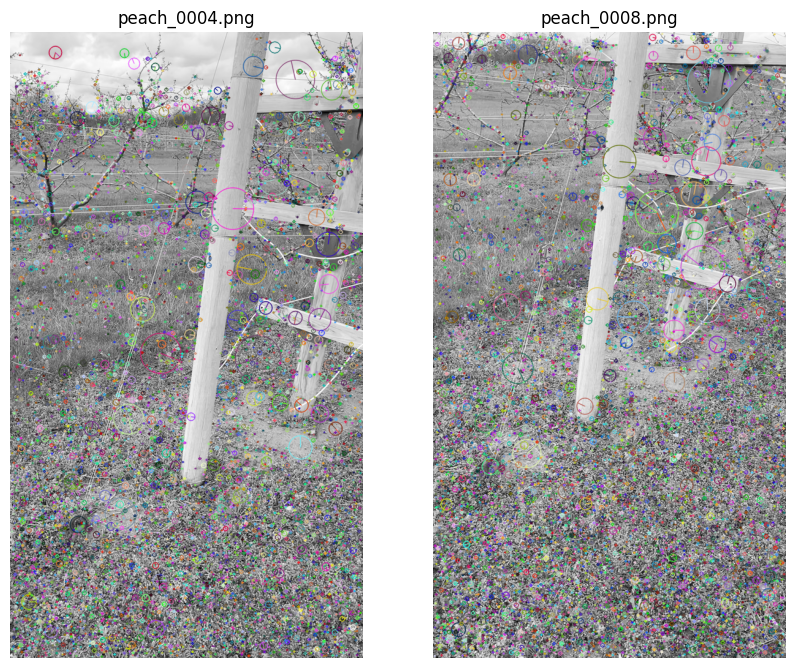

In [8]:
# visualization descriptors
img_desc_amygardens1 = cv.drawKeypoints(img_amygardens1, amygardens1_kps, None, flags=cv.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
img_desc_amygardens2 = cv.drawKeypoints(img_amygardens2, amygardens2_kps, None, flags=cv.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

fig, axs = plt.subplots(1,2, figsize=(10,20))
axs[0].imshow(img_desc_amygardens1)
axs[0].set_title(f"{amygardens1_name}")
axs[0].set_axis_off()

axs[1].imshow(img_desc_amygardens2)
axs[1].set_title(f"{amygardens2_name}")
axs[1].set_axis_off()

plt.show()

In [27]:
# Run the flann only for visualization, because needed data for visualization is not saved in the file
FLANN_INDEX_KDTREE = 1
index_params = dict(algorithm = FLANN_INDEX_KDTREE, trees = 5)
search_params = dict(checks=50)

flann = cv.FlannBasedMatcher(index_params, search_params)

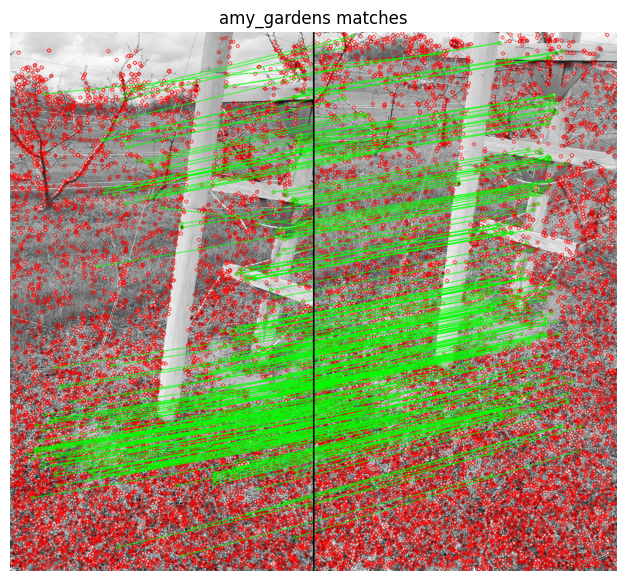

Number of descriptors peach_0004.png: 7684
Number of descriptors peach_0008.png: 8659
Number of matches: 7684
Number of good matches: 296


In [10]:
amygardens_flann = flann.knnMatch(amygardens1_desc, amygardens2_desc, k=2)
# Need to draw only good matches, so create a mask
amygardens_masked = [[0,0] for i in range(len(amygardens_flann))]
count_amygardens_good_matches = 0
 
# ratio test as per Lowe's paper
for i,(m,n) in enumerate(amygardens_flann):
    if m.distance < 0.7*n.distance:
        amygardens_masked[i]=[1,0]
        count_amygardens_good_matches += 1
 
draw_params = dict(matchColor = (0,255,0),
                   singlePointColor = (255,0,0),
                   matchesMask = amygardens_masked,
                   flags = cv.DrawMatchesFlags_DEFAULT)

draw_matches = cv.drawMatchesKnn(img_amygardens1,amygardens1_kps,img_amygardens2,amygardens2_kps,amygardens_flann,None,**draw_params)

# Draw a vertical line at the boundary
x = img_amygardens1.shape[1]
cv.line(draw_matches, (x, 0), (x, draw_matches.shape[0]), (0, 0, 0), 2)  # Green line, 2 pixels thick

plt.figure(figsize=(10,7))
plt.imshow(draw_matches)
plt.title("amy_gardens matches")
plt.axis("off")
plt.show()

print(f"Number of descriptors {amygardens1_name}: {len(amygardens1_desc)}")
print(f"Number of descriptors {amygardens2_name}: {len(amygardens2_desc)}")
print(f"Number of matches: {len(amygardens_flann)}")
print(f"Number of good matches: {count_amygardens_good_matches}")

In [28]:
sift2 = cv.SIFT_create(nfeatures=8000)

amygardens1_kps2, amygardens1_desc2 = sift2.detectAndCompute(amygardens1_np, None)
amygardens2_kps2, amygardens2_desc2 = sift2.detectAndCompute(amygardens2_np, None)

amygardens_flann2 = flann.knnMatch(amygardens1_desc2, amygardens2_desc2, k=2)
# Need to draw only good matches, so create a mask
amygardens_masked2 = [[0,0] for i in range(len(amygardens_flann2))]
count_amygardens_good_matches2 = 0
 
# ratio test as per Lowe's paper
for i,(m,n) in enumerate(amygardens_flann2):
    if m.distance < 0.7*n.distance:
        amygardens_masked2[i]=[1,0]
        count_amygardens_good_matches2 += 1

print(f"Number of descriptors {amygardens1_name}: {len(amygardens1_desc2)}")
print(f"Number of descriptors {amygardens2_name}: {len(amygardens2_desc2)}")
print(f"Number of matches: {len(amygardens_flann2)}")
print(f"Number of good matches: {count_amygardens_good_matches2}")

Number of descriptors peach_0004.png: 7684
Number of descriptors peach_0008.png: 8000
Number of matches: 7684
Number of good matches: 279


In [29]:
sift3 = cv.SIFT_create(nfeatures=2000)

amygardens1_kps3, amygardens1_desc3 = sift3.detectAndCompute(amygardens1_np, None)
amygardens2_kps3, amygardens2_desc3 = sift3.detectAndCompute(amygardens2_np, None)

amygardens_flann3 = flann.knnMatch(amygardens1_desc3, amygardens2_desc3, k=2)
# Need to draw only good matches, so create a mask
amygardens_masked3 = [[0,0] for i in range(len(amygardens_flann3))]
count_amygardens_good_matches3 = 0
 
# ratio test as per Lowe's paper
for i,(m,n) in enumerate(amygardens_flann3):
    if m.distance < 0.7*n.distance:
        amygardens_masked3[i]=[1,0]
        count_amygardens_good_matches3 += 1

print(f"Number of descriptors {amygardens1_name}: {len(amygardens1_desc3)}")
print(f"Number of descriptors {amygardens2_name}: {len(amygardens2_desc3)}")
print(f"Number of matches: {len(amygardens_flann3)}")
print(f"Number of good matches: {count_amygardens_good_matches3}")

Number of descriptors peach_0004.png: 2000
Number of descriptors peach_0008.png: 2000
Number of matches: 2000
Number of good matches: 80


## Visualization 2

In [ ]:
heritage_desc_filepath = "imc2023_heritage_descriptor.h5"
heritage_flann_filepath = "imc2023_heritage_flann.h5"
heritage_filepath = "data/train/imc2023_heritage"
outlier_name = "outliers_dsc_4473_thumb.png"
cyprus_name = "cyprus_dsc_6488.png"

img_outlier = cv.imread(os.path.join(heritage_filepath, outlier_name), cv.IMREAD_GRAYSCALE)
img_cyprus = cv.imread(os.path.join(heritage_filepath, cyprus_name), cv.IMREAD_GRAYSCALE)

# descriptors output
outlier_np, outlier_kps, outlier_desc = load_sift_output(os.path.join(sift_outputs_dir, heritage_desc_filepath), outlier_name)
cyprus_np, cyprus_kps, cyprus_desc = load_sift_output(os.path.join(sift_outputs_dir, heritage_desc_filepath), cyprus_name)

# matcher output
heritage_matches = load_flann_from_images_name(os.path.join(flann_outputs_dir, heritage_flann_filepath), [outlier_name, cyprus_name])

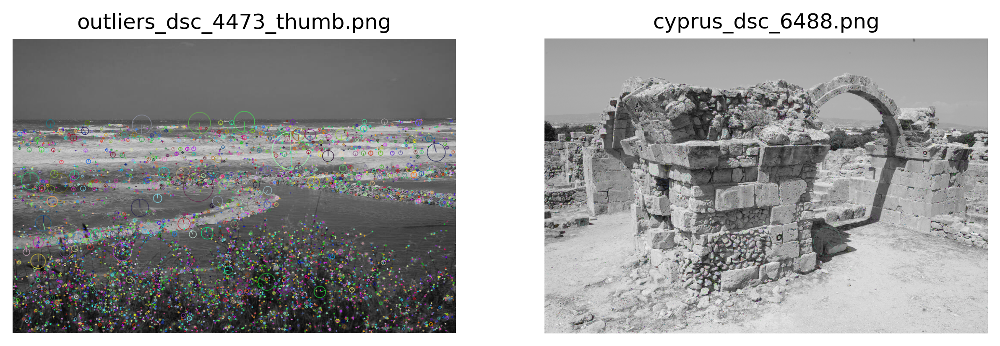

<Figure size 1920x1440 with 0 Axes>

In [22]:
# visualization descriptors
img_desc_outlier = cv.drawKeypoints(img_outlier, outlier_kps, None, flags=cv.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
img_desc_cyprus = cv.drawKeypoints(img_cyprus, cyprus_kps, None, flags=cv.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

fig, axs = plt.subplots(1,2, figsize=(10,20), dpi=300)
plt.figure(dpi=300)
axs[0].imshow(img_desc_outlier)
axs[0].set_title(f"{outlier_name}")
axs[0].set_axis_off()

axs[1].imshow(img_desc_cyprus)
axs[1].set_title(f"{cyprus_name}")
axs[1].set_axis_off()

plt.show()

In [30]:
# Run the flann only for visualization, because needed data for visualization is not saved in the file
FLANN_INDEX_KDTREE = 1
index_params = dict(algorithm = FLANN_INDEX_KDTREE, trees = 5)
search_params = dict(checks=50)

flann = cv.FlannBasedMatcher(index_params, search_params)

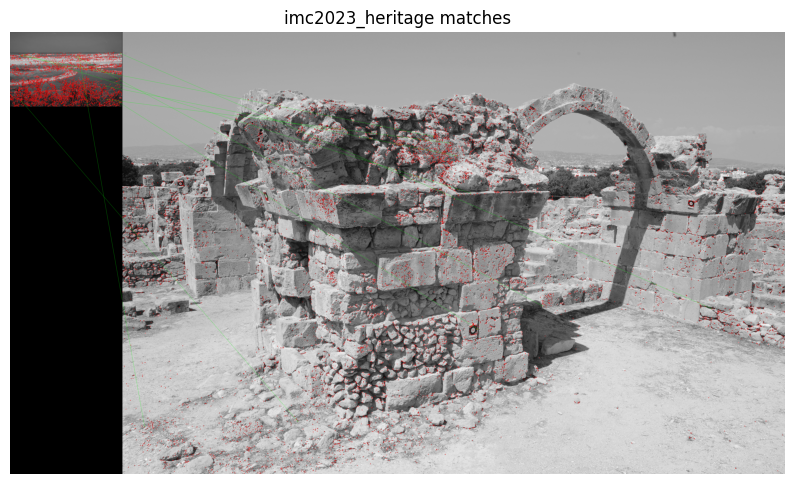

Number of descriptors outliers_dsc_4473_thumb.png: 6011
Number of descriptors cyprus_dsc_6488.png: 15000
Number of matches: 6011
Number of good matches: 9


In [24]:
heritage_flann = flann.knnMatch(outlier_desc, cyprus_desc, k=2)
# Need to draw only good matches, so create a mask
heritage_masked = [[0,0] for i in range(len(heritage_flann))]
count_heritage_good_matches = 0
 
# ratio test as per Lowe's paper
for i,(m,n) in enumerate(heritage_flann):
    if m.distance < 0.7*n.distance:
        heritage_masked[i]=[1,0]
        count_heritage_good_matches += 1
 
draw_params = dict(matchColor = (0,255,0),
                   singlePointColor = (255,0,0),
                   matchesMask = heritage_masked,
                   flags = cv.DrawMatchesFlags_DEFAULT)

draw_matches = cv.drawMatchesKnn(img_outlier,outlier_kps,img_cyprus,cyprus_kps,heritage_flann,None,**draw_params)

# Draw a vertical line at the boundary
x = img_outlier.shape[1]
cv.line(draw_matches, (x, 0), (x, draw_matches.shape[0]), (0, 0, 0), 2)  # Green line, 2 pixels thick

plt.figure(figsize=(10,7))
plt.imshow(draw_matches)
plt.title("imc2023_heritage matches")
plt.axis("off")
plt.show()

print(f"Number of descriptors {outlier_name}: {len(outlier_desc)}")
print(f"Number of descriptors {cyprus_name}: {len(cyprus_desc)}")
print(f"Number of matches: {len(heritage_flann)}")
print(f"Number of good matches: {count_heritage_good_matches}")

In [31]:
sift2 = cv.SIFT_create(nfeatures=8000)
outlier_kps2, outlier_desc2 = sift2.detectAndCompute(outlier_np, None)
cyprus_kps2, cyprus_desc2 = sift2.detectAndCompute(cyprus_np, None)

heritage_flann2 = flann.knnMatch(outlier_desc2, cyprus_desc2, k=2)
# Need to draw only good matches, so create a mask
heritage_masked2 = [[0,0] for i in range(len(heritage_flann2))]
count_heritage_good_matches2 = 0
 
# ratio test as per Lowe's paper
for i,(m,n) in enumerate(heritage_flann2):
    if m.distance < 0.7*n.distance:
        heritage_masked2[i]=[1,0]
        count_heritage_good_matches2 += 1

print(f"Number of descriptors {outlier_name}: {len(outlier_desc2)}")
print(f"Number of descriptors {cyprus_name}: {len(cyprus_desc2)}")
print(f"Number of matches: {len(heritage_flann2)}")
print(f"Number of good matches: {count_heritage_good_matches2}")

Number of descriptors outliers_dsc_4473_thumb.png: 6011
Number of descriptors cyprus_dsc_6488.png: 8001
Number of matches: 6011
Number of good matches: 8


In [32]:
sift3 = cv.SIFT_create(nfeatures=2000)
outlier_kps3, outlier_desc3 = sift3.detectAndCompute(outlier_np, None)
cyprus_kps3, cyprus_desc3 = sift3.detectAndCompute(cyprus_np, None)

heritage_flann3 = flann.knnMatch(outlier_desc3, cyprus_desc3, k=2)
# Need to draw only good matches, so create a mask
heritage_masked3 = [[0,0] for i in range(len(heritage_flann3))]
count_heritage_good_matches3 = 0
 
# ratio test as per Lowe's paper
for i,(m,n) in enumerate(heritage_flann3):
    if m.distance < 0.7*n.distance:
        heritage_masked3[i]=[1,0]
        count_heritage_good_matches3 += 1

print(f"Number of descriptors {outlier_name}: {len(outlier_desc3)}")
print(f"Number of descriptors {cyprus_name}: {len(cyprus_desc3)}")
print(f"Number of matches: {len(heritage_flann3)}")
print(f"Number of good matches: {count_heritage_good_matches3}")

Number of descriptors outliers_dsc_4473_thumb.png: 2000
Number of descriptors cyprus_dsc_6488.png: 2001
Number of matches: 2000
Number of good matches: 1


# Clustering (example)

In [20]:
sift_output_folder = "sift_descriptor_outputs"
flann_output_folder = "flann_outputs"

## ETs

### Example

In [22]:
ets_sift_filepath = os.path.join(sift_output_folder, "ETs_descriptor.h5")
ets_flann_filepath = os.path.join(flann_output_folder, "ETs_flann.h5")
ets_sift = []
ets_flann = []

for idx, name in enumerate(ets_images_name):
    sift_output = load_sift_output(ets_sift_filepath, name)
    ets_sift.append(sift_output)

for idx, pair in enumerate(ets_pairs):
    flann_output = load_flann_output(ets_flann_filepath, str(pair))
    ets_flann.append(flann_output)

G_ets = build_graph(ets_images_name, ets_flann)

G_ets.edges(data=True)

EdgeDataView([('outliers_out_et003.png', 'another_et_another_et002.png', {'weight': 15}), ('outliers_out_et003.png', 'another_et_another_et008.png', {'weight': 17}), ('et_et007.png', 'et_et006.png', {'weight': 296}), ('et_et007.png', 'et_et001.png', {'weight': 16}), ('et_et007.png', 'et_et004.png', {'weight': 28}), ('et_et007.png', 'et_et002.png', {'weight': 20}), ('et_et007.png', 'et_et008.png', {'weight': 155}), ('et_et007.png', 'et_et005.png', {'weight': 170}), ('et_et003.png', 'et_et001.png', {'weight': 126}), ('et_et003.png', 'et_et004.png', {'weight': 108}), ('et_et003.png', 'et_et002.png', {'weight': 52}), ('et_et003.png', 'et_et008.png', {'weight': 15}), ('et_et003.png', 'et_et000.png', {'weight': 379}), ('et_et006.png', 'et_et008.png', {'weight': 73}), ('et_et006.png', 'et_et005.png', {'weight': 184}), ('et_et006.png', 'another_et_another_et002.png', {'weight': 16}), ('et_et006.png', 'another_et_another_et001.png', {'weight': 16}), ('et_et001.png', 'et_et004.png', {'weight': 1

In [23]:
ets_clusters, ets_outliers = graph_clustering(G_ets)
print(f"ets clusters : {ets_clusters}")
print(f"ets outliers : {ets_outliers}")

ets clusters : [{2: {'et_et005.png', 'et_et007.png', 'et_et008.png', 'et_et006.png'}}, {3: {'et_et001.png', 'et_et000.png', 'et_et002.png', 'et_et004.png', 'et_et003.png'}}, {4: {'another_et_another_et006.png', 'another_et_another_et004.png', 'another_et_another_et005.png', 'another_et_another_et007.png', 'another_et_another_et002.png', 'another_et_another_et003.png', 'another_et_another_et001.png'}}, {5: {'another_et_another_et010.png', 'another_et_another_et009.png', 'outliers_out_et003.png', 'another_et_another_et008.png'}}]
ets outliers : [{0: {'outliers_out_et001.png'}}, {1: {'outliers_out_et002.png'}}]


In [65]:
ets_clusters

[{2: {'et_et005.png', 'et_et006.png', 'et_et007.png', 'et_et008.png'}},
 {3: {'et_et000.png',
   'et_et001.png',
   'et_et002.png',
   'et_et003.png',
   'et_et004.png'}},
 {4: {'another_et_another_et001.png',
   'another_et_another_et002.png',
   'another_et_another_et003.png',
   'another_et_another_et004.png',
   'another_et_another_et005.png',
   'another_et_another_et006.png',
   'another_et_another_et007.png'}},
 {5: {'another_et_another_et008.png',
   'another_et_another_et009.png',
   'another_et_another_et010.png',
   'outliers_out_et003.png'}}]

In [66]:
ets_outliers

[{0: {'outliers_out_et001.png'}}, {1: {'outliers_out_et002.png'}}]

In [25]:
# G_ets = nx.Graph()

# for idx, name in enumerate(ets_images_name):
#     G_ets.add_node(idx, image=name)

# G_ets.nodes(data=True)

NodeDataView({0: {'image': 'outliers_out_et001.png'}, 1: {'image': 'outliers_out_et003.png'}, 2: {'image': 'outliers_out_et002.png'}, 3: {'image': 'et_et007.png'}, 4: {'image': 'et_et003.png'}, 5: {'image': 'et_et006.png'}, 6: {'image': 'et_et001.png'}, 7: {'image': 'et_et004.png'}, 8: {'image': 'et_et002.png'}, 9: {'image': 'et_et008.png'}, 10: {'image': 'et_et005.png'}, 11: {'image': 'et_et000.png'}, 12: {'image': 'another_et_another_et006.png'}, 13: {'image': 'another_et_another_et002.png'}, 14: {'image': 'another_et_another_et010.png'}, 15: {'image': 'another_et_another_et004.png'}, 16: {'image': 'another_et_another_et007.png'}, 17: {'image': 'another_et_another_et008.png'}, 18: {'image': 'another_et_another_et003.png'}, 19: {'image': 'another_et_another_et005.png'}, 20: {'image': 'another_et_another_et001.png'}, 21: {'image': 'another_et_another_et009.png'}})

In [ ]:
# ets_sift_filepath = os.path.join(sift_output_folder, "ETs_descriptor.h5")
# ets_flann_filepath = os.path.join(flann_output_folder, "ETs_flann.h5")
# ets_sift = []
# ets_flann = []

# for idx, name in enumerate(ets_images_name):
#     sift_output = load_sift_output(ets_sift_filepath, name)
#     ets_sift.append(sift_output)

# for idx, pair in enumerate(ets_pairs):
#     flann_output = load_flann_output(ets_flann_filepath, str(pair))
#     ets_flann.append(flann_output)

In [43]:
# ets_good_matches = [len(data["good_matches"]) for data in ets_flann]
# ets_good_matches

[2,
 8,
 1,
 5,
 4,
 1,
 6,
 3,
 4,
 9,
 4,
 5,
 3,
 3,
 3,
 4,
 1,
 4,
 2,
 2,
 6,
 13,
 2,
 7,
 8,
 4,
 9,
 6,
 3,
 11,
 4,
 6,
 15,
 9,
 4,
 3,
 17,
 2,
 4,
 13,
 6,
 3,
 7,
 6,
 1,
 2,
 7,
 7,
 3,
 2,
 6,
 9,
 4,
 6,
 2,
 7,
 9,
 2,
 10,
 6,
 12,
 296,
 16,
 28,
 20,
 155,
 170,
 13,
 6,
 10,
 8,
 10,
 10,
 5,
 6,
 6,
 9,
 11,
 10,
 126,
 108,
 52,
 15,
 12,
 379,
 13,
 6,
 9,
 4,
 3,
 11,
 6,
 11,
 6,
 14,
 8,
 12,
 12,
 73,
 184,
 14,
 12,
 16,
 4,
 12,
 7,
 8,
 8,
 9,
 16,
 11,
 138,
 256,
 16,
 31,
 185,
 7,
 11,
 11,
 9,
 11,
 8,
 7,
 8,
 9,
 10,
 110,
 45,
 73,
 174,
 10,
 6,
 5,
 5,
 10,
 10,
 8,
 8,
 8,
 14,
 22,
 28,
 77,
 7,
 12,
 15,
 8,
 7,
 8,
 8,
 12,
 10,
 16,
 112,
 18,
 11,
 8,
 5,
 3,
 3,
 5,
 9,
 4,
 9,
 11,
 14,
 6,
 12,
 6,
 15,
 5,
 6,
 8,
 11,
 5,
 11,
 10,
 8,
 5,
 3,
 10,
 8,
 5,
 3,
 14,
 11,
 111,
 13,
 84,
 122,
 44,
 85,
 97,
 80,
 15,
 16,
 303,
 67,
 27,
 161,
 268,
 481,
 11,
 9,
 16,
 32,
 8,
 8,
 8,
 25,
 47,
 22,
 158,
 284,
 244,
 16,
 97,
 37,
 

In [73]:
# threshold = 1.5 * np.median(ets_good_matches)
# threshold

15.0

In [ ]:
# for result in ets_flann:
#     pair = result["pair"]
#     count_good_matches = len(result["good_matches"])
#     if count_good_matches >= threshold:
#         G_ets.add_edge(pair[0], pair[1], weight=count_good_matches)

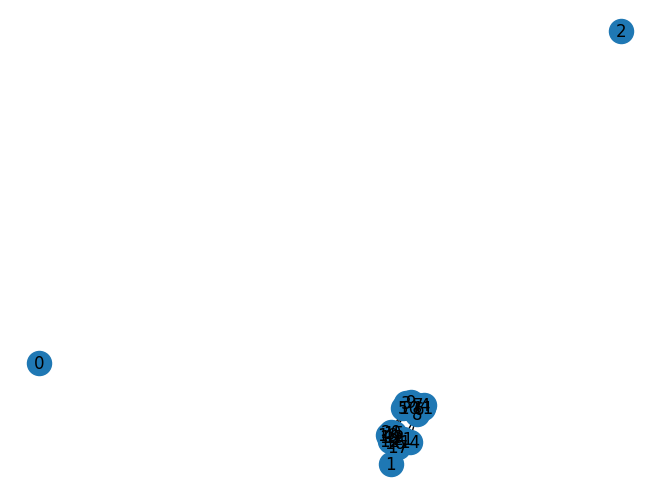

In [75]:
# nx.draw(G_ets, with_labels=True)
# plt.show()

In [107]:
# !pip install python-louvain

                                              0.0/204.6 kB ? eta -:--:--
     -------                                 41.0/204.6 kB 1.9 MB/s eta 0:00:01
     ------------------------------------   194.6/204.6 kB 2.4 MB/s eta 0:00:01
     -------------------------------------- 204.6/204.6 kB 1.8 MB/s eta 0:00:00
  Preparing metadata (setup.py): started
  Preparing metadata (setup.py): finished with status 'done'
  Created wheel for python-louvain: filename=python_louvain-0.16-py3-none-any.whl size=9403 sha256=c98b69b03b56cc86c1f1ca8c7860f80b114eaa49461d7526535c91fb024b0c21
  Stored in directory: c:\users\kezia_n\appdata\local\pip\cache\wheels\11\c1\e7\f62a211c636275e2da798bf0c307a3ae79aeddaf2524a03ce4
Successfully built python-louvain



[notice] A new release of pip is available: 23.1.2 -> 25.1.1
[notice] To update, run: python.exe -m pip install --upgrade pip


In [117]:
# ets_louvain = nx.community.louvain_communities(G_ets, seed=123) # use networkx function for louvain_communities
# ets_louvain

[{0},
 {2},
 {3, 5, 9, 10},
 {4, 6, 7, 8, 11},
 {1, 14, 17, 21},
 {12, 13, 15, 16, 18, 19, 20}]

In [121]:
# import community as community_louvain # use from python-louvain

# ets_partitions = community_louvain.best_partition(G_ets, weight="weight")

# ets_clusters_tmp = defaultdict(list)
# for node, community in ets_partitions.items():
#     ets_clusters_tmp[community].append(node)

# ets_clusters_tmp

defaultdict(list,
            {0: [0],
             1: [1, 14, 17, 21],
             2: [2],
             3: [3, 5, 9, 10],
             4: [4, 6, 7, 8, 11],
             5: [12, 13, 15, 16, 18, 19, 20]})

In [123]:
# ets_louvain_len = [len(community) for community in ets_louvain]
# ets_louvain_len

[1, 1, 4, 5, 4, 7]

In [ ]:
# ets_clusters = []
# outlier_clusters = []

# for i, community in enumerate(ets_louvain):
#     if len(community) >= np.median(ets_louvain_len):
#         ets_clusters.append({i : community})
#     else:
#         outlier_clusters.append({i : community})

In [127]:
# ets_clusters

[{2: {3, 5, 9, 10}},
 {3: {4, 6, 7, 8, 11}},
 {4: {1, 14, 17, 21}},
 {5: {12, 13, 15, 16, 18, 19, 20}}]

In [128]:
# outlier_clusters

[{0: {0}}, {1: {2}}]

### Try with RANSAC

In [25]:
ets_sift_filepath = os.path.join(sift_output_folder, "ETs_descriptor.h5")
ets_flann_filepath = os.path.join(flann_output_folder, "ETs_flann.h5")
ets_sift = []
ets_flann = []

for idx, name in enumerate(ets_images_name):
    sift_output = load_sift_output(ets_sift_filepath, name)
    ets_sift.append(sift_output)

for idx, pair in enumerate(ets_pairs):
    flann_output = load_flann_output(ets_flann_filepath, str(pair))
    ets_flann.append(flann_output)

In [54]:
ets_ransac = []

for result in ets_flann:
    pair = result["pair"]
    good_matches = result["good_matches"]
    image0 = result["images_name"][0]
    image1 = result["images_name"][1]
    
    if len(good_matches) < 8: # based on opencv documentation, to use RANSAC it needs min. 8 points
        continue

    kps0 = load_sift_output(ets_sift_filepath, image0)[1]
    kps1 = load_sift_output(ets_sift_filepath, image1)[1]

    pts0 = np.float32([kps0[m.queryIdx].pt for m in good_matches]).reshape(-1,1,2)
    pts1 = np.float32([kps1[m.trainIdx].pt for m in good_matches]).reshape(-1,1,2)

    F, mask = cv.findFundamentalMat(pts0, pts1, cv.FM_RANSAC, 1.5, 0.99)
    
    if F is None or mask is None:
        continue

    inlier = [m for i,m in enumerate(good_matches) if mask[i][0] == 1]
    ets_ransac.append({
        "pair": pair,
        "images_name" : [image0, image1],
        "good_matches" : inlier,
        # "image0": image0,
        # "image1": image1,
        # "inlier": inlier
    })

In [58]:
ets_ransac

[{'pair': (0, 2),
  'images_name': ['outliers_out_et001.png', 'outliers_out_et002.png'],
  'good_matches': [< cv2.DMatch 00000258355F42F0>,
   < cv2.DMatch 00000258355F40D0>,
   < cv2.DMatch 00000258355F4230>,
   < cv2.DMatch 00000258355F4170>,
   < cv2.DMatch 00000258355F4310>,
   < cv2.DMatch 00000258355F4330>,
   < cv2.DMatch 00000258355F40B0>]},
 {'pair': (1, 2),
  'images_name': ['outliers_out_et003.png', 'outliers_out_et002.png'],
  'good_matches': [< cv2.DMatch 00000258355F5350>,
   < cv2.DMatch 00000258355F52D0>,
   < cv2.DMatch 00000258355F52B0>,
   < cv2.DMatch 00000258355F5290>,
   < cv2.DMatch 00000258355F5390>,
   < cv2.DMatch 00000258355F53B0>,
   < cv2.DMatch 00000258355F5370>,
   < cv2.DMatch 00000258355F5430>]},
 {'pair': (1, 5),
  'images_name': ['outliers_out_et003.png', 'et_et006.png'],
  'good_matches': [< cv2.DMatch 00000258355F56F0>,
   < cv2.DMatch 00000258355F56B0>,
   < cv2.DMatch 00000258355F56D0>,
   < cv2.DMatch 00000258355F5730>,
   < cv2.DMatch 0000025835

In [59]:
len(ets_ransac)

137

In [60]:
G_ets2 = build_graph(ets_images_name, ets_ransac)

G_ets2.edges(data=True)

EdgeDataView([('et_et007.png', 'et_et006.png', {'weight': 255}), ('et_et007.png', 'et_et004.png', {'weight': 18}), ('et_et007.png', 'et_et008.png', {'weight': 125}), ('et_et007.png', 'et_et005.png', {'weight': 137}), ('et_et003.png', 'et_et001.png', {'weight': 99}), ('et_et003.png', 'et_et004.png', {'weight': 90}), ('et_et003.png', 'et_et002.png', {'weight': 32}), ('et_et003.png', 'et_et000.png', {'weight': 313}), ('et_et006.png', 'et_et008.png', {'weight': 53}), ('et_et006.png', 'et_et005.png', {'weight': 155}), ('et_et001.png', 'et_et004.png', {'weight': 92}), ('et_et001.png', 'et_et002.png', {'weight': 233}), ('et_et001.png', 'et_et005.png', {'weight': 15}), ('et_et001.png', 'et_et000.png', {'weight': 170}), ('et_et004.png', 'et_et002.png', {'weight': 82}), ('et_et004.png', 'et_et008.png', {'weight': 36}), ('et_et004.png', 'et_et005.png', {'weight': 61}), ('et_et004.png', 'et_et000.png', {'weight': 156}), ('et_et002.png', 'et_et008.png', {'weight': 16}), ('et_et002.png', 'et_et005.p

In [61]:
ets_clusters2, ets_outliers2 = graph_clustering(G_ets2)
print(f"ets clusters : {ets_clusters2}")
print(f"ets outliers : {ets_outliers2}")

ets clusters : [{3: {'et_et005.png', 'et_et007.png', 'et_et008.png', 'et_et006.png'}}, {4: {'et_et001.png', 'et_et000.png', 'et_et002.png', 'et_et004.png', 'et_et003.png'}}, {5: {'another_et_another_et010.png', 'another_et_another_et009.png', 'another_et_another_et008.png'}}, {6: {'another_et_another_et006.png', 'another_et_another_et004.png', 'another_et_another_et005.png', 'another_et_another_et007.png', 'another_et_another_et002.png', 'another_et_another_et003.png', 'another_et_another_et001.png'}}]
ets outliers : [{0: {'outliers_out_et001.png'}}, {1: {'outliers_out_et003.png'}}, {2: {'outliers_out_et002.png'}}]


In [64]:
ets_clusters

[{2: {'et_et005.png', 'et_et006.png', 'et_et007.png', 'et_et008.png'}},
 {3: {'et_et000.png',
   'et_et001.png',
   'et_et002.png',
   'et_et003.png',
   'et_et004.png'}},
 {4: {'another_et_another_et001.png',
   'another_et_another_et002.png',
   'another_et_another_et003.png',
   'another_et_another_et004.png',
   'another_et_another_et005.png',
   'another_et_another_et006.png',
   'another_et_another_et007.png'}},
 {5: {'another_et_another_et008.png',
   'another_et_another_et009.png',
   'another_et_another_et010.png',
   'outliers_out_et003.png'}}]

In [62]:
ets_clusters2

[{3: {'et_et005.png', 'et_et006.png', 'et_et007.png', 'et_et008.png'}},
 {4: {'et_et000.png',
   'et_et001.png',
   'et_et002.png',
   'et_et003.png',
   'et_et004.png'}},
 {5: {'another_et_another_et008.png',
   'another_et_another_et009.png',
   'another_et_another_et010.png'}},
 {6: {'another_et_another_et001.png',
   'another_et_another_et002.png',
   'another_et_another_et003.png',
   'another_et_another_et004.png',
   'another_et_another_et005.png',
   'another_et_another_et006.png',
   'another_et_another_et007.png'}}]

In [63]:
ets_outliers2

[{0: {'outliers_out_et001.png'}},
 {1: {'outliers_out_et003.png'}},
 {2: {'outliers_out_et002.png'}}]

## imc2023_heritage

### Example

In [70]:
heritage_sift_filepath = os.path.join(sift_output_folder, "imc2023_heritage_descriptor.h5")
heritage_flann_filepath = os.path.join(flann_output_folder, "imc2023_heritage_flann.h5")
heritage_sift = []
heritage_flann = []

for idx, name in enumerate(heritage_images_name):
    sift_output = load_sift_output(heritage_sift_filepath, name)
    ets_sift.append(sift_output)

for idx, pair in enumerate(heritage_pairs):
    flann_output = load_flann_output(heritage_flann_filepath, str(pair))
    heritage_flann.append(flann_output)

G_heritage = build_graph(heritage_images_name, heritage_flann)

G_heritage.edges(data=True)

EdgeDataView([('outliers_dsc_4120_thumb.png', 'outliers_dsc_4122_thumb.png', {'weight': 881}), ('outliers_dsc_4120_thumb.png', 'outliers_dsc_4125_thumb.png', {'weight': 23}), ('outliers_dsc_4120_thumb.png', 'outliers_img_3222.png', {'weight': 18}), ('outliers_dsc_4120_thumb.png', 'outliers_img_3262.png', {'weight': 21}), ('outliers_dsc_4120_thumb.png', 'outliers_img_8630_thumb.png', {'weight': 42}), ('outliers_dsc_4120_thumb.png', 'outliers_img_8632.png', {'weight': 55}), ('outliers_dsc_4120_thumb.png', 'outliers_img_8634.png', {'weight': 59}), ('outliers_dsc_4120_thumb.png', 'outliers_img_9084.png', {'weight': 19}), ('outliers_dsc_4120_thumb.png', 'dioscuri_3dom_fbk_img_1541.png', {'weight': 18}), ('outliers_dsc_4120_thumb.png', 'dioscuri_img_0161.png', {'weight': 18}), ('outliers_dsc_4120_thumb.png', 'dioscuri_img_0418.png', {'weight': 19}), ('outliers_dsc_4120_thumb.png', 'dioscuri_img_0359.png', {'weight': 18}), ('outliers_dsc_4120_thumb.png', 'wall_dsc_4973_acr.png', {'weight': 20

In [120]:
heritage_clusters, heritage_outliers = graph_clustering(G_heritage)
print(f"heritage clusters : {heritage_clusters}")
print(f"heritage outliers : {heritage_outliers}")

heritage clusters : [{2: {'dioscuri_img_0348.png', 'outliers_dsc_4122_thumb.png', 'outliers_img_9085.png', 'dioscuri_img_0132.png', 'outliers_dsc_4128_thumb.png', 'outliers_img_8894.png', 'outliers_img_8948_thumb.png', 'outliers_img_3249.png', 'dioscuri_img_0364.png', 'dioscuri_archive_0015.png', 'dioscuri_img_0200.png', 'dioscuri_archive_0036.png', 'dioscuri_img_0161.png', 'dioscuri_img_0105.png', 'outliers_img_9065.png', 'dioscuri_img_0187.png', 'dioscuri_3dom_fbk_img_1566.png', 'outliers_img_8641.png', 'dioscuri_img_0188.png', 'outliers_img_8367.png', 'dioscuri_img_0376.png', 'dioscuri_img_0258.png', 'dioscuri_img_0163.png', 'outliers_dsc_4127_thumb.png', 'dioscuri_img_0359.png', 'dioscuri_archive_0033.png', 'outliers_dsc_4176_thumb.png', 'dioscuri_archive_0071.png', 'dioscuri_img_0216.png', 'outliers_img_8662.png', 'dioscuri_3dom_fbk_img_1563.png', 'outliers_img_3262.png', 'dioscuri_archive_0004.png', 'dioscuri_3dom_fbk_img_1516.png', 'dioscuri_img_0055.png', 'dioscuri_archive_0160

In [103]:
count = 0
for com in heritage_clusters:
    count += len(list(com.values())[0])

for com in heritage_outliers:
    count += len(list(com.values())[0])

print(count)

209


In [121]:
heritage_clusters

[{2: {'dioscuri_3dom_fbk_img_1516.png',
   'dioscuri_3dom_fbk_img_1520.png',
   'dioscuri_3dom_fbk_img_1524.png',
   'dioscuri_3dom_fbk_img_1541.png',
   'dioscuri_3dom_fbk_img_1548.png',
   'dioscuri_3dom_fbk_img_1561.png',
   'dioscuri_3dom_fbk_img_1563.png',
   'dioscuri_3dom_fbk_img_1566.png',
   'dioscuri_3dom_fbk_img_1580.png',
   'dioscuri_archive_0003.png',
   'dioscuri_archive_0004.png',
   'dioscuri_archive_0010.png',
   'dioscuri_archive_0015.png',
   'dioscuri_archive_0022.png',
   'dioscuri_archive_0026.png',
   'dioscuri_archive_0028.png',
   'dioscuri_archive_0033.png',
   'dioscuri_archive_0034.png',
   'dioscuri_archive_0036.png',
   'dioscuri_archive_0068.png',
   'dioscuri_archive_0069.png',
   'dioscuri_archive_0070.png',
   'dioscuri_archive_0071.png',
   'dioscuri_archive_0072.png',
   'dioscuri_archive_0092.png',
   'dioscuri_archive_0095.png',
   'dioscuri_archive_0116.png',
   'dioscuri_archive_0160.png',
   'dioscuri_archive_0171.png',
   'dioscuri_archive_023

In [122]:
heritage_outliers

[{0: {'outliers_dsc_4115_thumb.png'}},
 {1: {'outliers_dsc_4129_thumb.png'}},
 {3: {'outliers_img_3222.png',
   'outliers_img_3225.png',
   'outliers_img_3229.png',
   'outliers_img_3237.png',
   'outliers_img_3240.png'}},
 {4: {'outliers_dsc_4165_thumb.png', 'outliers_dsc_4167_thumb.png'}},
 {5: {'outliers_img_9078.png', 'outliers_img_9078_thumb.png'}}]

### Try with ransac

In [104]:
heritage_sift_filepath = os.path.join(sift_output_folder, "imc2023_heritage_descriptor.h5")
heritage_flann_filepath = os.path.join(flann_output_folder, "imc2023_heritage_flann.h5")
heritage_sift = []
heritage_flann = []

for idx, name in enumerate(heritage_images_name):
    sift_output = load_sift_output(heritage_sift_filepath, name)
    ets_sift.append(sift_output)

for idx, pair in enumerate(heritage_pairs):
    flann_output = load_flann_output(heritage_flann_filepath, str(pair))
    heritage_flann.append(flann_output)

In [105]:
heritage_ransac = []

for result in heritage_flann:
    pair = result["pair"]
    good_matches = result["good_matches"]
    image0 = result["images_name"][0]
    image1 = result["images_name"][1]
    
    if len(good_matches) < 8: # based on opencv documentation, to use RANSAC it needs min. 8 points
        continue

    kps0 = load_sift_output(heritage_sift_filepath, image0)[1]
    kps1 = load_sift_output(heritage_sift_filepath, image1)[1]

    pts0 = np.float32([kps0[m.queryIdx].pt for m in good_matches]).reshape(-1,1,2)
    pts1 = np.float32([kps1[m.trainIdx].pt for m in good_matches]).reshape(-1,1,2)

    F, mask = cv.findFundamentalMat(pts0, pts1, cv.FM_RANSAC, 1.5, 0.99)
    
    if F is None or mask is None:
        continue

    inlier = [m for i,m in enumerate(good_matches) if mask[i][0] == 1]
    heritage_ransac.append({
        "pair": pair,
        "images_name" : [image0, image1],
        "good_matches" : inlier,
        # "image0": image0,
        # "image1": image1,
        # "inlier": inlier
    })

In [106]:
G_heritage2 = build_graph(heritage_images_name, heritage_ransac)

G_heritage2.edges(data=True)

EdgeDataView([('outliers_dsc_4120_thumb.png', 'outliers_dsc_4122_thumb.png', {'weight': 763}), ('outliers_dsc_4120_thumb.png', 'outliers_img_8630_thumb.png', {'weight': 28}), ('outliers_dsc_4120_thumb.png', 'outliers_img_8632.png', {'weight': 37}), ('outliers_dsc_4120_thumb.png', 'outliers_img_8634.png', {'weight': 27}), ('outliers_dsc_4120_thumb.png', 'wall_dsc_4943_acr.png', {'weight': 12}), ('outliers_dsc_4122_thumb.png', 'outliers_img_8630_thumb.png', {'weight': 24}), ('outliers_dsc_4122_thumb.png', 'outliers_img_8632.png', {'weight': 62}), ('outliers_dsc_4122_thumb.png', 'outliers_img_8634.png', {'weight': 28}), ('outliers_dsc_4128_thumb.png', 'outliers_img_8641.png', {'weight': 79}), ('outliers_dsc_4165_thumb.png', 'outliers_dsc_4167_thumb.png', {'weight': 1567}), ('outliers_dsc_4165_thumb.png', 'outliers_img_8634.png', {'weight': 15}), ('outliers_dsc_4165_thumb.png', 'dioscuri_img_0161.png', {'weight': 12}), ('outliers_dsc_4165_thumb.png', 'dioscuri_img_0460.png', {'weight': 12}

In [107]:
heritage_clusters2, heritage_outliers2 = graph_clustering(G_heritage2)
print(f"heritage clusters : {heritage_clusters2}")
print(f"heritage outliers : {heritage_outliers2}")

heritage clusters : [{1: {'outliers_img_3251.png', 'outliers_img_3250.png'}}, {4: {'outliers_dsc_4128_thumb.png', 'outliers_img_8641.png'}}, {6: {'outliers_dsc_4474_thumb.png', 'outliers_dsc_4473_thumb.png'}}, {7: {'outliers_img_3225.png', 'outliers_img_3222.png'}}, {10: {'outliers_img_3237.png', 'outliers_img_3240.png'}}, {12: {'outliers_img_9072.png', 'outliers_img_8600.png', 'outliers_img_8599.png'}}, {17: {'outliers_img_9065.png', 'outliers_img_9068.png'}}, {18: {'outliers_img_8632.png', 'outliers_dsc_4120_thumb.png', 'outliers_img_8375.png', 'outliers_dsc_4122_thumb.png', 'outliers_img_9085.png', 'outliers_img_8916.png', 'outliers_img_8948_thumb.png', 'outliers_img_3249.png', 'dioscuri_archive_0036.png', 'dioscuri_3dom_fbk_img_1548.png', 'outliers_img_8367.png', 'outliers_img_8372.png', 'outliers_img_8634.png', 'dioscuri_archive_0033.png', 'outliers_dsc_4176_thumb.png', 'dioscuri_3dom_fbk_img_1541.png', 'outliers_img_8630_thumb.png', 'outliers_dsc_4177_thumb.png', 'outliers_img_86

In [111]:
count = 0
for com in heritage_clusters2:
    count += len(list(com.values())[0])

for com in heritage_outliers2:
    count += len(list(com.values())[0])

print(count)

209


In [ ]:
# Note: adjust code so that if the threshold for number of image in a community (alpha) below 3,
# set it to 3

In [ ]:
heritage_clusters2

# after code adjustment the community 1,4,6,7,10,17 will belong to outlier group

[{1: {'outliers_img_3250.png', 'outliers_img_3251.png'}},
 {4: {'outliers_dsc_4128_thumb.png', 'outliers_img_8641.png'}},
 {6: {'outliers_dsc_4473_thumb.png', 'outliers_dsc_4474_thumb.png'}},
 {7: {'outliers_img_3222.png', 'outliers_img_3225.png'}},
 {10: {'outliers_img_3237.png', 'outliers_img_3240.png'}},
 {12: {'outliers_img_8599.png',
   'outliers_img_8600.png',
   'outliers_img_9072.png'}},
 {17: {'outliers_img_9065.png', 'outliers_img_9068.png'}},
 {18: {'dioscuri_3dom_fbk_img_1541.png',
   'dioscuri_3dom_fbk_img_1548.png',
   'dioscuri_archive_0003.png',
   'dioscuri_archive_0022.png',
   'dioscuri_archive_0033.png',
   'dioscuri_archive_0036.png',
   'dioscuri_archive_0068.png',
   'dioscuri_archive_0069.png',
   'dioscuri_archive_0072.png',
   'dioscuri_archive_0095.png',
   'outliers_dsc_4120_thumb.png',
   'outliers_dsc_4122_thumb.png',
   'outliers_dsc_4176_thumb.png',
   'outliers_dsc_4177_thumb.png',
   'outliers_dsc_4178_thumb.png',
   'outliers_img_3249.png',
   'outlie

In [114]:
heritage_outliers

[{0: {'outliers_dsc_4115_thumb.png'}},
 {1: {'outliers_dsc_4129_thumb.png'}},
 {2: {'outliers_img_3222.png',
   'outliers_img_3225.png',
   'outliers_img_3229.png',
   'outliers_img_3237.png',
   'outliers_img_3240.png'}},
 {3: {'outliers_img_9078.png', 'outliers_img_9078_thumb.png'}},
 {5: {'outliers_dsc_4165_thumb.png', 'outliers_dsc_4167_thumb.png'}}]

In [113]:
heritage_outliers2

[{0: {'outliers_dsc_4115_thumb.png'}},
 {2: {'outliers_dsc_4125_thumb.png'}},
 {3: {'outliers_dsc_4127_thumb.png'}},
 {5: {'outliers_dsc_4129_thumb.png'}},
 {8: {'outliers_img_3229.png'}},
 {9: {'outliers_img_3233.png'}},
 {11: {'outliers_img_3262.png'}},
 {13: {'outliers_img_8648.png'}},
 {14: {'outliers_img_8656_thumb.png'}},
 {15: {'outliers_img_8838_thumb.png'}},
 {16: {'outliers_img_8894.png'}},
 {24: {'cyprus_dsc_6557.png'}}]

## Amy gardens

### Example

In [124]:
garden_sift_filepath = os.path.join(sift_output_folder, "amy_gardens_descriptor.h5")
garden_flann_filepath = os.path.join(flann_output_folder, "amy_gardens_flann.h5")
garden_sift = []
garden_flann = []

for idx, name in enumerate(garden_images_name):
    sift_output = load_sift_output(garden_sift_filepath, name)
    garden_sift.append(sift_output)

for idx, pair in enumerate(garden_pairs):
    flann_output = load_flann_output(garden_flann_filepath, str(pair))
    garden_flann.append(flann_output)

G_garden = build_graph(garden_images_name, garden_flann)

G_garden.edges(data=True)

EdgeDataView([('peach_0100.png', 'peach_0091.png', {'weight': 20}), ('peach_0100.png', 'peach_0151.png', {'weight': 13}), ('peach_0100.png', 'peach_0097.png', {'weight': 11}), ('peach_0100.png', 'peach_0174.png', {'weight': 15}), ('peach_0100.png', 'peach_0031.png', {'weight': 13}), ('peach_0100.png', 'peach_0056.png', {'weight': 15}), ('peach_0100.png', 'peach_0053.png', {'weight': 14}), ('peach_0100.png', 'peach_0032.png', {'weight': 12}), ('peach_0100.png', 'peach_0115.png', {'weight': 16}), ('peach_0100.png', 'peach_0062.png', {'weight': 13}), ('peach_0100.png', 'peach_0027.png', {'weight': 12}), ('peach_0100.png', 'peach_0033.png', {'weight': 13}), ('peach_0100.png', 'peach_0034.png', {'weight': 13}), ('peach_0100.png', 'peach_0128.png', {'weight': 15}), ('peach_0100.png', 'peach_0010.png', {'weight': 11}), ('peach_0100.png', 'peach_0018.png', {'weight': 11}), ('peach_0100.png', 'peach_0079.png', {'weight': 11}), ('peach_0100.png', 'peach_0134.png', {'weight': 12}), ('peach_0100.p

In [125]:
garden_clusters, garden_outliers = graph_clustering(G_garden)
print(f"garden clusters : {garden_clusters}")
print(f"garden outliers : {garden_outliers}")

garden clusters : [{0: {'peach_0085.png', 'peach_0041.png', 'peach_0113.png', 'peach_0050.png', 'peach_0159.png', 'peach_0001.png', 'peach_0136.png'}}, {1: {'peach_0196.png', 'peach_0145.png', 'peach_0030.png', 'peach_0060.png', 'peach_0007.png', 'peach_0036.png', 'peach_0131.png'}}, {3: {'peach_0182.png', 'peach_0110.png', 'peach_0009.png', 'peach_0185.png', 'peach_0176.png', 'peach_0005.png', 'peach_0108.png', 'peach_0179.png', 'peach_0125.png', 'peach_0094.png', 'peach_0160.png', 'peach_0197.png'}}, {4: {'peach_0112.png', 'peach_0106.png', 'peach_0019.png', 'peach_0003.png', 'peach_0027.png', 'peach_0166.png', 'peach_0099.png', 'peach_0167.png', 'peach_0049.png', 'peach_0134.png', 'peach_0067.png', 'peach_0073.png', 'peach_0058.png'}}, {6: {'peach_0122.png', 'peach_0045.png', 'peach_0164.png', 'peach_0127.png', 'peach_0021.png', 'peach_0051.png', 'peach_0008.png', 'peach_0138.png', 'peach_0074.png', 'peach_0135.png', 'peach_0115.png', 'peach_0123.png', 'peach_0066.png', 'peach_0025.

In [128]:
count = 0
for com in garden_clusters:
    count += len(list(com.values())[0])

for com in garden_outliers:
    count += len(list(com.values())[0])

print(count)

200


In [127]:
garden_clusters

[{0: {'peach_0001.png',
   'peach_0041.png',
   'peach_0050.png',
   'peach_0085.png',
   'peach_0113.png',
   'peach_0136.png',
   'peach_0159.png'}},
 {1: {'peach_0007.png',
   'peach_0030.png',
   'peach_0036.png',
   'peach_0060.png',
   'peach_0131.png',
   'peach_0145.png',
   'peach_0196.png'}},
 {3: {'peach_0005.png',
   'peach_0009.png',
   'peach_0094.png',
   'peach_0108.png',
   'peach_0110.png',
   'peach_0125.png',
   'peach_0160.png',
   'peach_0176.png',
   'peach_0179.png',
   'peach_0182.png',
   'peach_0185.png',
   'peach_0197.png'}},
 {4: {'peach_0003.png',
   'peach_0019.png',
   'peach_0027.png',
   'peach_0049.png',
   'peach_0058.png',
   'peach_0067.png',
   'peach_0073.png',
   'peach_0099.png',
   'peach_0106.png',
   'peach_0112.png',
   'peach_0134.png',
   'peach_0166.png',
   'peach_0167.png'}},
 {6: {'peach_0000.png',
   'peach_0002.png',
   'peach_0004.png',
   'peach_0008.png',
   'peach_0010.png',
   'peach_0011.png',
   'peach_0012.png',
   'peach_0

In [129]:
garden_outliers

[{2: {'peach_0037.png',
   'peach_0076.png',
   'peach_0081.png',
   'peach_0141.png',
   'peach_0143.png',
   'peach_0199.png'}},
 {5: {'peach_0154.png', 'peach_0171.png'}},
 {7: {'peach_0098.png', 'peach_0152.png'}},
 {8: {'peach_0039.png', 'peach_0048.png', 'peach_0129.png', 'peach_0130.png'}},
 {10: {'peach_0006.png',
   'peach_0024.png',
   'peach_0084.png',
   'peach_0116.png'}},
 {11: {'peach_0068.png',
   'peach_0133.png',
   'peach_0147.png',
   'peach_0158.png',
   'peach_0168.png'}}]

### Try with ransac

In [130]:
garden_sift_filepath = os.path.join(sift_output_folder, "amy_gardens_descriptor.h5")
garden_flann_filepath = os.path.join(flann_output_folder, "amy_gardens_flann.h5")
garden_sift = []
garden_flann = []

for idx, name in enumerate(garden_images_name):
    sift_output = load_sift_output(garden_sift_filepath, name)
    garden_sift.append(sift_output)

for idx, pair in enumerate(garden_pairs):
    flann_output = load_flann_output(garden_flann_filepath, str(pair))
    garden_flann.append(flann_output)

In [131]:
garden_ransac = []

for result in garden_flann:
    pair = result["pair"]
    good_matches = result["good_matches"]
    image0 = result["images_name"][0]
    image1 = result["images_name"][1]
    
    if len(good_matches) < 8: # based on opencv documentation, to use RANSAC it needs min. 8 points
        continue

    kps0 = load_sift_output(garden_sift_filepath, image0)[1]
    kps1 = load_sift_output(garden_sift_filepath, image1)[1]

    pts0 = np.float32([kps0[m.queryIdx].pt for m in good_matches]).reshape(-1,1,2)
    pts1 = np.float32([kps1[m.trainIdx].pt for m in good_matches]).reshape(-1,1,2)

    F, mask = cv.findFundamentalMat(pts0, pts1, cv.FM_RANSAC, 1.5, 0.99)
    
    if F is None or mask is None:
        continue

    inlier = [m for i,m in enumerate(good_matches) if mask[i][0] == 1]
    garden_ransac.append({
        "pair": pair,
        "images_name" : [image0, image1],
        "good_matches" : inlier,
        # "image0": image0,
        # "image1": image1,
        # "inlier": inlier
    })

In [132]:
G_garden2 = build_graph(garden_images_name, garden_ransac)

G_garden2.edges(data=True)

EdgeDataView([('peach_0100.png', 'peach_0091.png', {'weight': 12}), ('peach_0091.png', 'peach_0075.png', {'weight': 19}), ('peach_0091.png', 'peach_0087.png', {'weight': 13}), ('peach_0091.png', 'peach_0104.png', {'weight': 12}), ('peach_0091.png', 'peach_0141.png', {'weight': 11}), ('peach_0091.png', 'peach_0128.png', {'weight': 41}), ('peach_0091.png', 'peach_0037.png', {'weight': 11}), ('peach_0075.png', 'peach_0087.png', {'weight': 24}), ('peach_0075.png', 'peach_0068.png', {'weight': 11}), ('peach_0075.png', 'peach_0143.png', {'weight': 14}), ('peach_0075.png', 'peach_0081.png', {'weight': 14}), ('peach_0075.png', 'peach_0104.png', {'weight': 24}), ('peach_0075.png', 'peach_0128.png', {'weight': 255}), ('peach_0087.png', 'peach_0183.png', {'weight': 12}), ('peach_0087.png', 'peach_0033.png', {'weight': 13}), ('peach_0087.png', 'peach_0104.png', {'weight': 62}), ('peach_0087.png', 'peach_0128.png', {'weight': 15}), ('peach_0087.png', 'peach_0146.png', {'weight': 61}), ('peach_0089.

In [133]:
garden_clusters2, garden_outliers2 = graph_clustering(G_garden2)
print(f"garden clusters : {garden_clusters2}")
print(f"garden outliers : {garden_outliers2}")

garden clusters : [{0: {'peach_0019.png', 'peach_0067.png', 'peach_0166.png'}}, {1: {'peach_0158.png', 'peach_0186.png', 'peach_0068.png', 'peach_0165.png', 'peach_0032.png', 'peach_0015.png', 'peach_0069.png', 'peach_0010.png', 'peach_0147.png', 'peach_0168.png', 'peach_0115.png', 'peach_0123.png', 'peach_0144.png', 'peach_0142.png', 'peach_0133.png'}}, {2: {'peach_0026.png', 'peach_0118.png', 'peach_0020.png', 'peach_0084.png', 'peach_0127.png', 'peach_0006.png', 'peach_0024.png', 'peach_0040.png', 'peach_0116.png'}}, {5: {'peach_0013.png', 'peach_0096.png', 'peach_0181.png'}}, {7: {'peach_0085.png', 'peach_0156.png', 'peach_0113.png', 'peach_0001.png', 'peach_0136.png', 'peach_0041.png', 'peach_0172.png', 'peach_0191.png', 'peach_0050.png', 'peach_0159.png'}}, {8: {'peach_0196.png', 'peach_0007.png', 'peach_0177.png', 'peach_0102.png', 'peach_0145.png', 'peach_0060.png', 'peach_0174.png', 'peach_0131.png'}}, {11: {'peach_0149.png', 'peach_0004.png', 'peach_0044.png', 'peach_0008.png

In [134]:
count = 0
for com in garden_clusters2:
    count += len(list(com.values())[0])

for com in garden_outliers2:
    count += len(list(com.values())[0])

print(count)

200


In [138]:
garden_clusters2

[{0: {'peach_0019.png', 'peach_0067.png', 'peach_0166.png'}},
 {1: {'peach_0010.png',
   'peach_0015.png',
   'peach_0032.png',
   'peach_0068.png',
   'peach_0069.png',
   'peach_0115.png',
   'peach_0123.png',
   'peach_0133.png',
   'peach_0142.png',
   'peach_0144.png',
   'peach_0147.png',
   'peach_0158.png',
   'peach_0165.png',
   'peach_0168.png',
   'peach_0186.png'}},
 {2: {'peach_0006.png',
   'peach_0020.png',
   'peach_0024.png',
   'peach_0026.png',
   'peach_0040.png',
   'peach_0084.png',
   'peach_0116.png',
   'peach_0118.png',
   'peach_0127.png'}},
 {5: {'peach_0013.png', 'peach_0096.png', 'peach_0181.png'}},
 {7: {'peach_0001.png',
   'peach_0041.png',
   'peach_0050.png',
   'peach_0085.png',
   'peach_0113.png',
   'peach_0136.png',
   'peach_0156.png',
   'peach_0159.png',
   'peach_0172.png',
   'peach_0191.png'}},
 {8: {'peach_0007.png',
   'peach_0060.png',
   'peach_0102.png',
   'peach_0131.png',
   'peach_0145.png',
   'peach_0174.png',
   'peach_0177.png

In [140]:
garden_outliers

[{2: {'peach_0037.png',
   'peach_0076.png',
   'peach_0081.png',
   'peach_0141.png',
   'peach_0143.png',
   'peach_0199.png'}},
 {5: {'peach_0154.png', 'peach_0171.png'}},
 {7: {'peach_0098.png', 'peach_0152.png'}},
 {8: {'peach_0039.png', 'peach_0048.png', 'peach_0129.png', 'peach_0130.png'}},
 {10: {'peach_0006.png',
   'peach_0024.png',
   'peach_0084.png',
   'peach_0116.png'}},
 {11: {'peach_0068.png',
   'peach_0133.png',
   'peach_0147.png',
   'peach_0158.png',
   'peach_0168.png'}}]

In [139]:
garden_outliers2

[{3: {'peach_0175.png'}},
 {4: {'peach_0132.png'}},
 {6: {'peach_0078.png'}},
 {9: {'peach_0000.png'}},
 {10: {'peach_0031.png'}},
 {15: {'peach_0192.png'}},
 {17: {'peach_0057.png', 'peach_0095.png'}},
 {19: {'peach_0049.png'}},
 {24: {'peach_0022.png', 'peach_0109.png'}},
 {25: {'peach_0039.png', 'peach_0130.png'}},
 {27: {'peach_0052.png'}},
 {28: {'peach_0030.png', 'peach_0036.png'}},
 {29: {'peach_0153.png'}},
 {30: {'peach_0054.png'}},
 {31: {'peach_0105.png'}},
 {32: {'peach_0012.png'}},
 {34: {'peach_0137.png'}}]